## Import

In [1]:
import warnings
warnings.filterwarnings('ignore')
import os
import zipfile
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.inspection import permutation_importance
from sklearn.model_selection import cross_val_score

# 1. Space Flights’ Mission Status SM

In [2]:
mission_status = pd.read_csv('astro_3.csv', encoding='latin-1')
mission_status.head()

,id,Company,Launch Date,Launch Time,Launch Site,Vehicle Type,Liftoff Thrust (kN),Payload to Orbit (kg),Rocket Height (m),Fairing Diameter (m),...,weathercode,snowfall,soil_moisture_0_to_7cm,soil_moisture_7_to_28cm,soil_moisture_28_to_100cm,soil_moisture_100_to_255cm,soil_temperature_0_to_7cm,soil_temperature_7_to_28cm,soil_temperature_28_to_100cm,soil_temperature_100_to_255cm
0,1,SpaceX,24-Mar-06,22:30,Marshall Islands,Falcon 1,343,470,22.25,1.5,...,1,0,0.0,0.0,0.0,0.0,28.3,28.3,28.3,28.3
1,2,SpaceX,21-Mar-07,1:10,Marshall Islands,Falcon 1,343,470,22.25,1.5,...,0,0,0.0,0.0,0.0,0.0,28.8,28.8,28.8,28.8
2,3,SpaceX,3-Aug-08,3:34,Marshall Islands,Falcon 1,343,470,22.25,1.5,...,2,0,0.0,0.0,0.0,0.0,28.1,28.1,28.1,28.1
3,4,SpaceX,3-Aug-08,3:34,Marshall Islands,Falcon 1,343,470,22.25,1.5,...,2,0,0.0,0.0,0.0,0.0,28.1,28.1,28.1,28.1
4,5,SpaceX,3-Aug-08,3:34,Marshall Islands,Falcon 1,343,470,22.25,1.5,...,2,0,0.0,0.0,0.0,0.0,28.1,28.1,28.1,28.1


Payload type

In [3]:
mission_status.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146 entries, 0 to 145
Data columns (total 50 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             146 non-null    int64  
 1   Company                        146 non-null    object 
 2   Launch Date                    146 non-null    object 
 3   Launch Time                    146 non-null    object 
 4   Launch Site                    146 non-null    object 
 5   Vehicle Type                   146 non-null    object 
 6   Liftoff Thrust (kN)            146 non-null    int64  
 7   Payload to Orbit (kg)          146 non-null    int64  
 8   Rocket Height (m)              146 non-null    float64
 9   Fairing Diameter (m)           142 non-null    float64
 10  Payload Name                   146 non-null    object 
 11  Payload Type                   143 non-null    object 
 12  Payload Mass (kg)              129 non-null    obj

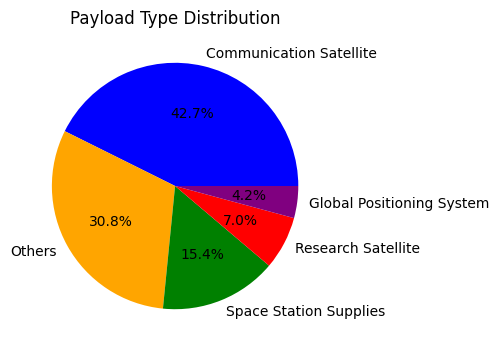

In [4]:
payload_counts = mission_status['Payload Type'].value_counts()

threshold = 0.03 * len(mission_status)
small_categories = payload_counts[payload_counts < threshold].index
mission_status['Payload Type'] = mission_status['Payload Type'].apply(lambda x: 'Others' if x in small_categories else x)

payload_counts = mission_status['Payload Type'].value_counts()

colors_for_all_status = ['blue', 'orange', 'green', 'red', 'purple']  

plt.figure(figsize=(4, 4))
plt.pie(payload_counts, labels=payload_counts.index, autopct='%1.1f%%', colors=colors_for_all_status)
plt.title('Payload Type Distribution')
plt.show()

## 1.1 Success and failure

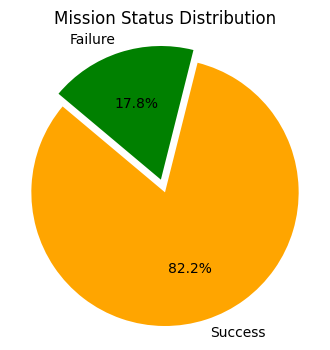

In [5]:
success_data = mission_status[mission_status["Mission Status"] == "Success"]
failure_data = mission_status[mission_status["Mission Status"] == "Failure"]

success_count = len(success_data)
failure_count = len(failure_data)

labels = ["Success", "Failure"]
sizes = [success_count, failure_count]

explode = (0, 0.1) 

colors_for_all_status = ['orange', 'green']  
plt.figure(figsize=(4, 4))
plt.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', startangle=140,  colors=colors_for_all_status)
plt.axis('equal')
plt.title("Mission Status Distribution")
plt.show()

Success and failure as the year

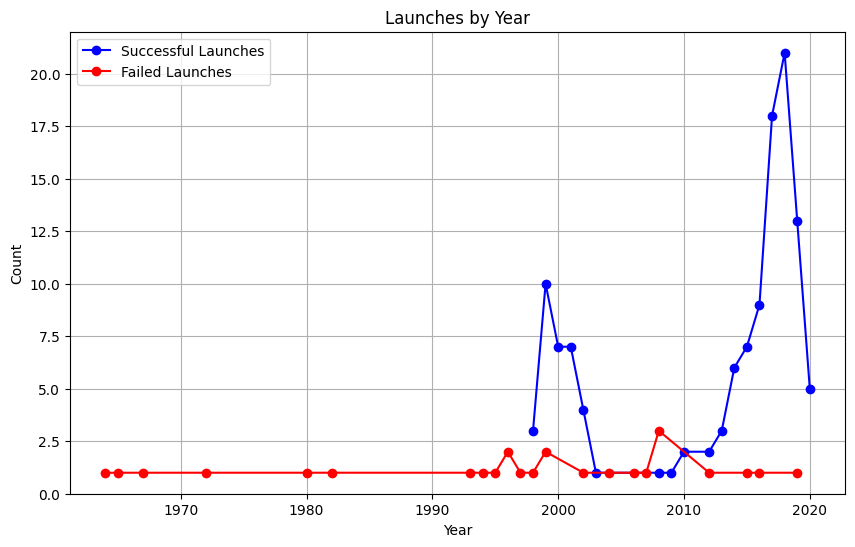

In [6]:
success_data['time'] = pd.to_datetime(success_data['time'])
failure_data['time'] = pd.to_datetime(failure_data['time'])

success_by_year = success_data.groupby(success_data['time'].dt.year).size()
failure_by_year = failure_data.groupby(failure_data['time'].dt.year).size()

plt.figure(figsize=(10, 6))
plt.plot(success_by_year.index, success_by_year.values, marker='o', linestyle='-', color='blue', label='Successful Launches')
plt.plot(failure_by_year.index, failure_by_year.values, marker='o', linestyle='-', color='red', label='Failed Launches')
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Launches by Year')
plt.legend()
plt.grid(True)
plt.show()

## 1.2 Number of launches

Number of launches by month

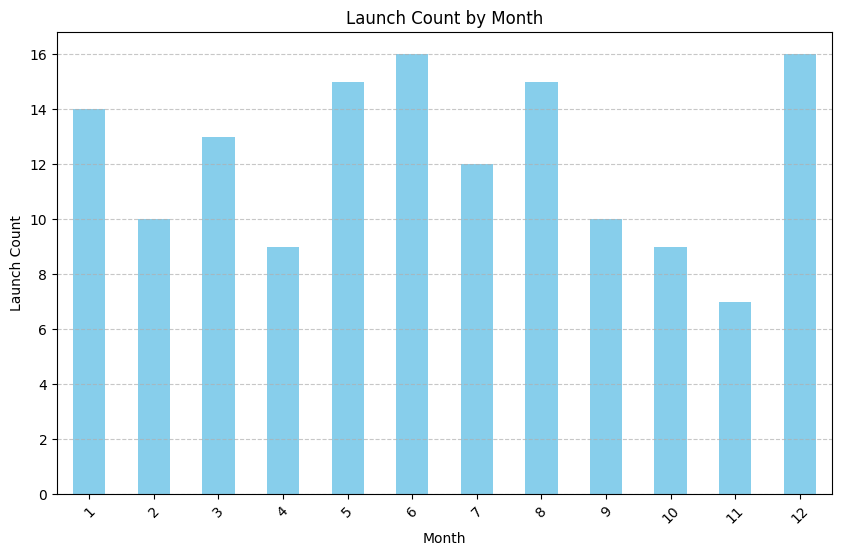

In [7]:
mission_status['Launch Date'] = pd.to_datetime(mission_status['Launch Date'])

monthly_launch_count = mission_status.groupby(mission_status['Launch Date'].dt.month).size()

plt.figure(figsize=(10, 6))
monthly_launch_count.plot(kind='bar', color='skyblue')
plt.xlabel('Month')
plt.ylabel('Launch Count')
plt.title('Launch Count by Month')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Failure number of of launches by month

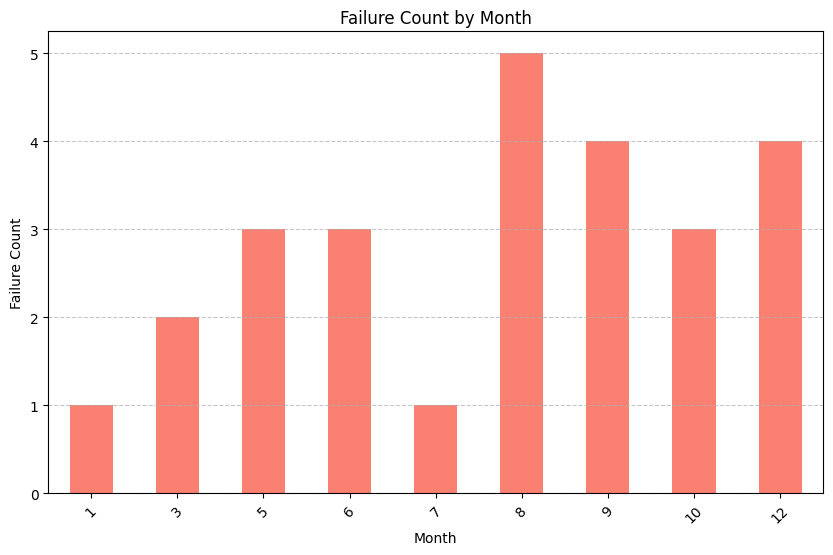

In [8]:
failure_data = mission_status[mission_status["Mission Status"] == "Failure"]

monthly_failure_count = failure_data.groupby(failure_data['Launch Date'].dt.month).size()

plt.figure(figsize=(10, 6))
monthly_failure_count.plot(kind='bar', color='salmon')
plt.xlabel('Month')
plt.ylabel('Failure Count')
plt.title('Failure Count by Month')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## 1.3 K-means for failure lunches features

In [9]:
failure_data = mission_status[mission_status["Mission Status"] == "Failure"]

K-means analysis for the group features of atmospheric conditions

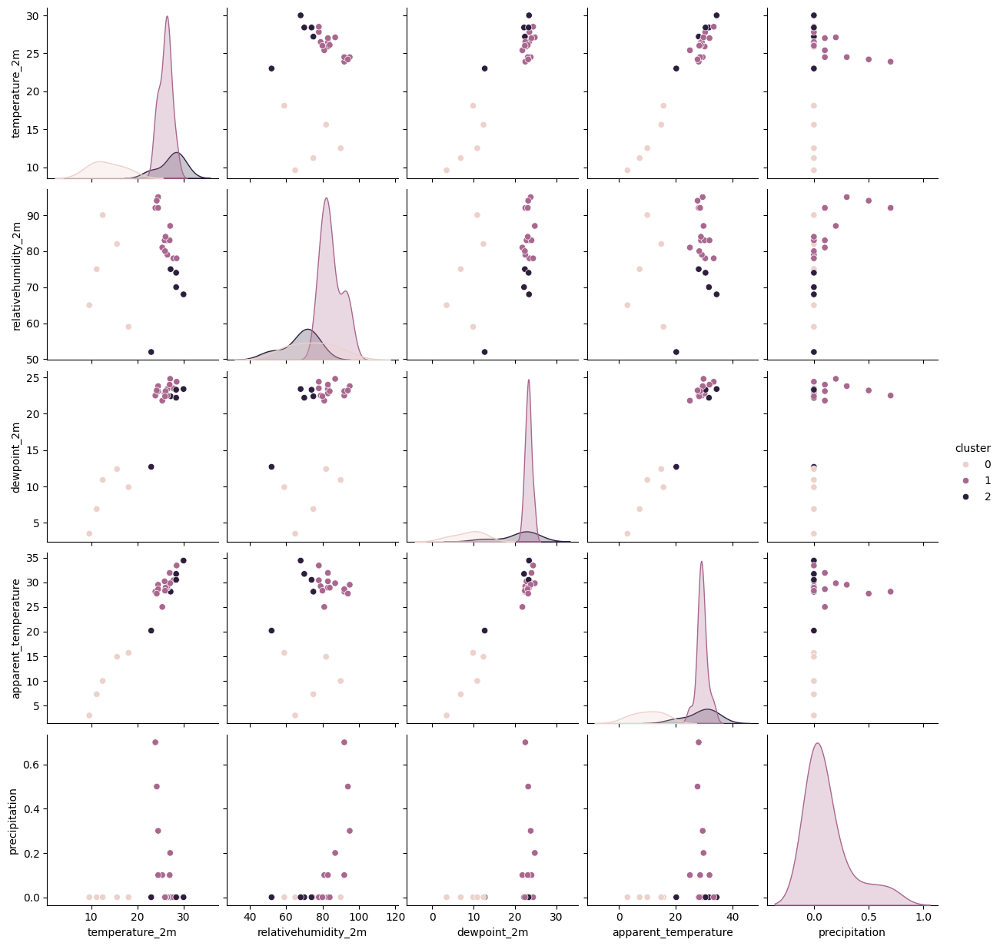

In [10]:
# Atmospheric conditions
features1 = ['temperature_2m', 'relativehumidity_2m', 'dewpoint_2m', 'apparent_temperature', 'precipitation']
X = failure_data[features1]
X = X.select_dtypes(include=np.number)
kmeans = KMeans(n_clusters=3, random_state=42)
failure_data['cluster'] = kmeans.fit_predict(X)

sns.pairplot(data=failure_data, hue='cluster', vars=features1, diag_kind='kde')
plt.show()

K-means analysis for the group features of pressure and cloud cover

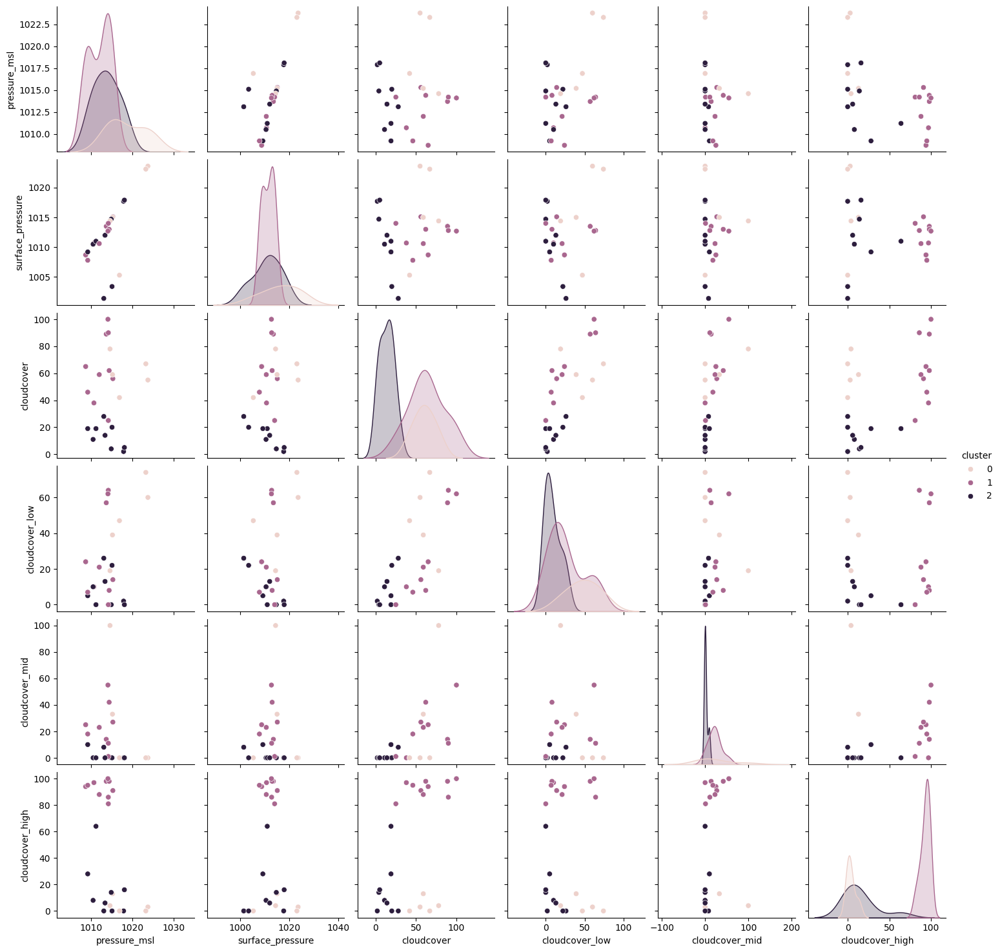

In [11]:
# Pressure and cloud cover
features2 = ['pressure_msl', 'surface_pressure', 'cloudcover', 'cloudcover_low', 'cloudcover_mid', 'cloudcover_high']
X = failure_data[features2]

kmeans = KMeans(n_clusters=3, random_state=42)
failure_data['cluster'] = kmeans.fit_predict(X)

sns.pairplot(data=failure_data, hue='cluster', vars=features2, diag_kind='kde')
plt.show()

K-means analysis for the group features of wind conditions

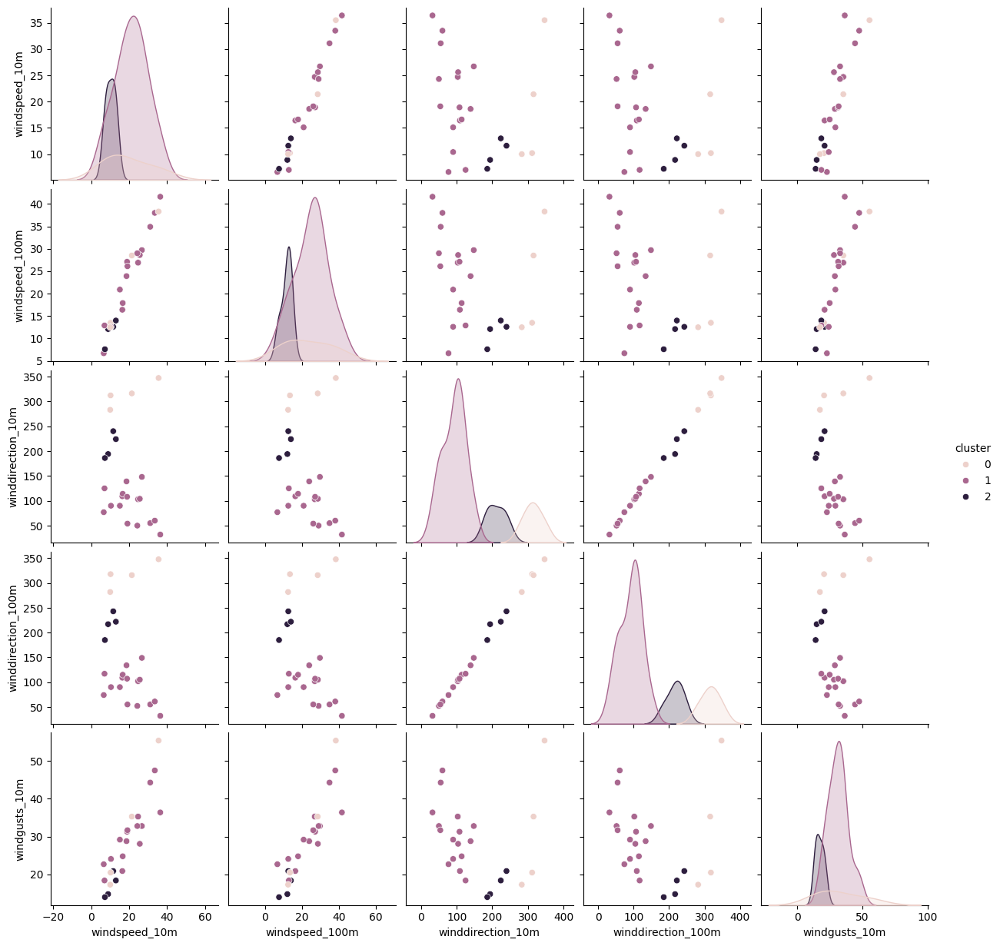

In [12]:
# Wind conditions
features3 = ['windspeed_10m', 'windspeed_100m', 'winddirection_10m', 'winddirection_100m', 'windgusts_10m']

X = failure_data[features3]

kmeans = KMeans(n_clusters=3, random_state=42)
failure_data['cluster'] = kmeans.fit_predict(X)

sns.pairplot(data=failure_data, hue='cluster', vars=features3, diag_kind='kde')
plt.show()

K-means analysis for the group features of radiation and evapotranspiration

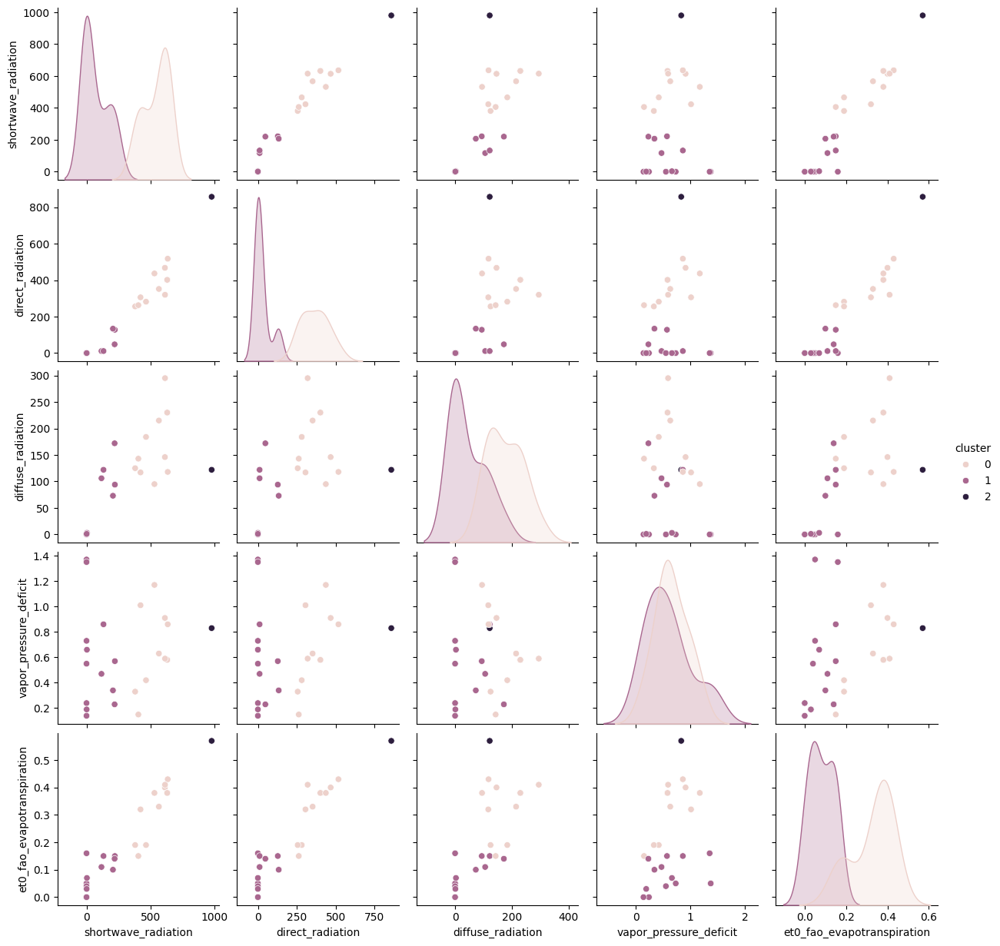

In [13]:
# Radiation and evapotranspiration
features4 = ['shortwave_radiation', 'direct_radiation', 'diffuse_radiation', 'vapor_pressure_deficit', 'et0_fao_evapotranspiration']

X = failure_data[features4]

kmeans = KMeans(n_clusters=3, random_state=42)
failure_data['cluster'] = kmeans.fit_predict(X)

sns.pairplot(data=failure_data, hue='cluster', vars=features4, diag_kind='kde')
plt.show()

K-means analysis for the group features of soil moisture

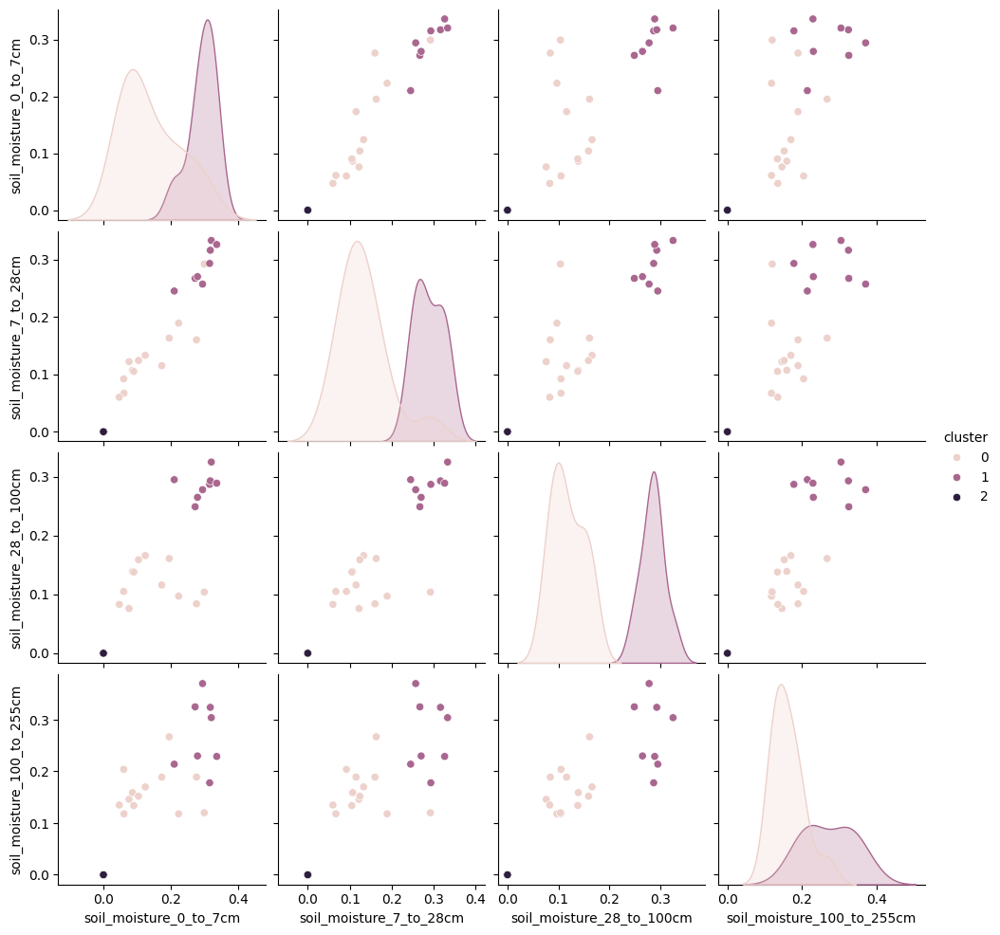

In [14]:
# Soil moisture
features5 = ['soil_moisture_0_to_7cm', 'soil_moisture_7_to_28cm', 'soil_moisture_28_to_100cm','soil_moisture_100_to_255cm']

X = failure_data[features5]

kmeans = KMeans(n_clusters=3, random_state=42)
failure_data['cluster'] = kmeans.fit_predict(X)

sns.pairplot(data=failure_data, hue='cluster', vars=features5, diag_kind='kde')
plt.show()

K-means analysis for the group features of soil temperature

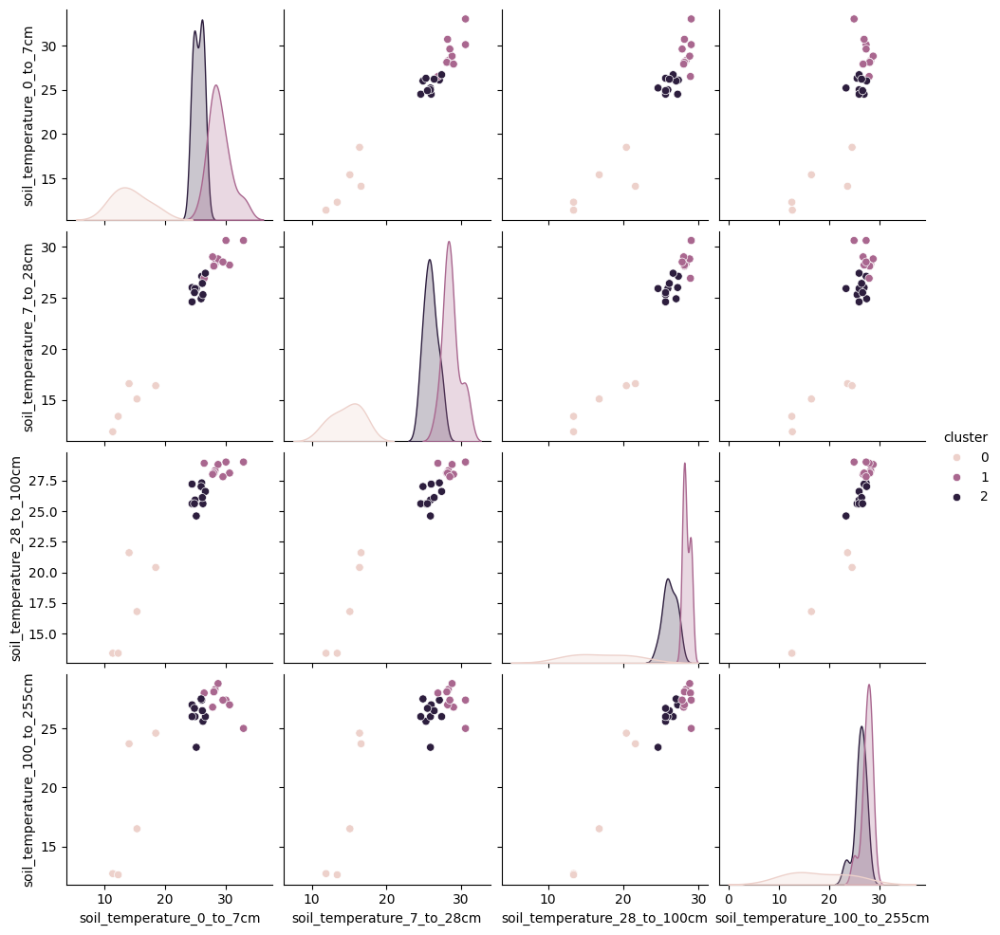

In [15]:
# soil temperature
features6 = ['soil_temperature_0_to_7cm','soil_temperature_7_to_28cm','soil_temperature_28_to_100cm','soil_temperature_100_to_255cm']
X = failure_data[features6]

kmeans = KMeans(n_clusters=3, random_state=42)
failure_data['cluster'] = kmeans.fit_predict(X)

sns.pairplot(data=failure_data, hue='cluster', vars=features6, diag_kind='kde')
plt.show()

K-means analysis for all numerical features 

In [16]:
Feature = features1 + features2 + features3 + features4 + features5 + features6
print("number of analytical features:", len(Feature))

X = failure_data[Feature]

kmeans = KMeans(n_clusters=3, random_state=42)
failure_data['cluster'] = kmeans.fit_predict(X)

sns.pairplot(data=failure_data, hue='cluster', vars=Feature, diag_kind='kde')
plt.show()

number of analytical features: 29


## 1.4 Importance of features on the outcomes of mission

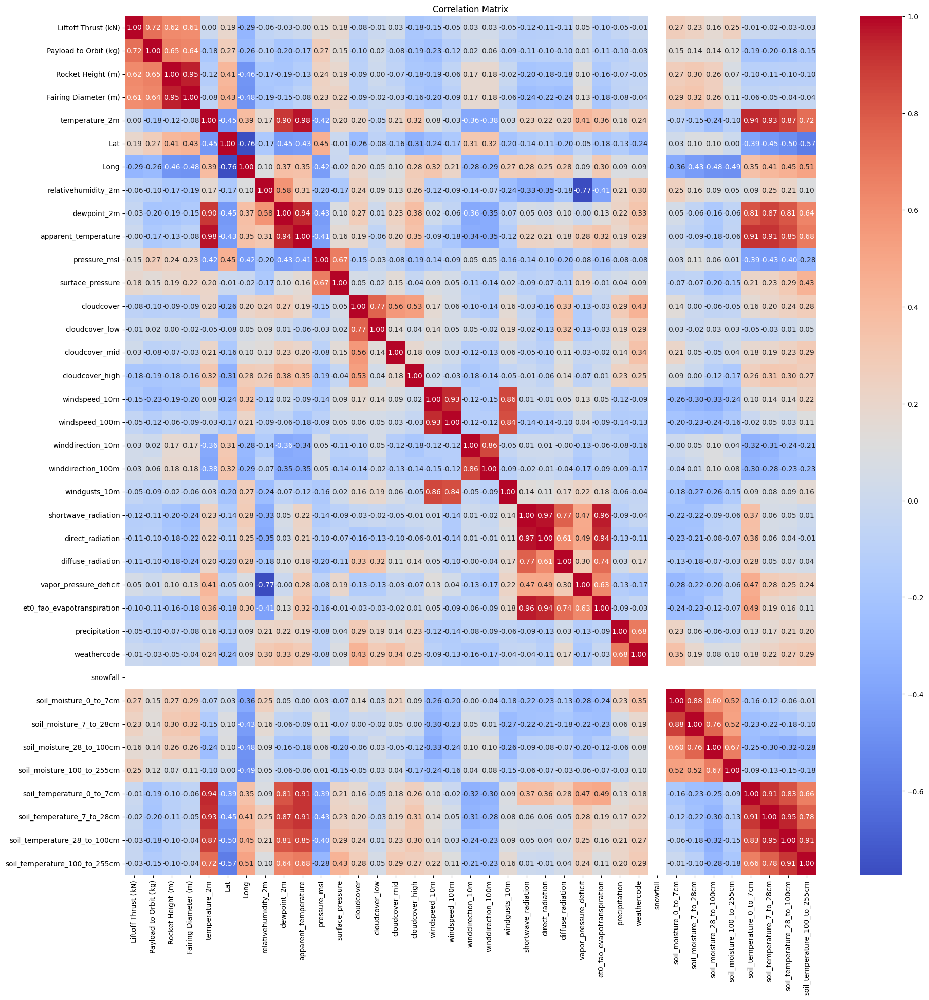

In [17]:
data = pd.read_csv('astro_3.csv', encoding='latin-1')
numerical_data = data.select_dtypes(include=np.number)
numerical_data = numerical_data.drop('id', axis=1)
correlation_matrix = numerical_data.corr()
plt.figure(figsize=(22,22))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [18]:
df = pd.read_csv('astro_3.csv', encoding='latin-1')
df_cleaned = df.dropna(axis=1) # remove columns containing any missing values 
X = df_cleaned.drop('id', axis=1)
X = X.drop('Mission Status', axis=1)
y = df_cleaned['Mission Status']
X = X.select_dtypes(include=np.number)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, random_state=42)

### Decision Tree

In [19]:
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [20]:
train_preds = dt_classifier.predict(X_train)
y_pred = dt_classifier.predict(X_test)
# Evaluate the model
train_accuracy = accuracy_score(y_train, train_preds)
test_accuracy = accuracy_score(y_test, y_pred)
print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.9927536231884058
Testing Accuracy: 0.875


Feature Importance:
1. Liftoff Thrust (kN): 0.549137685655343
2. Long: 0.16859851661291803
3. weathercode: 0.05341074020319306
4. soil_temperature_100_to_255cm: 0.052761472336944004
5. windgusts_10m: 0.0461477910968644
6. vapor_pressure_deficit: 0.03755442670537011
7. temperature_2m: 0.03338171262699565
8. et0_fao_evapotranspiration: 0.02503628447024674
9. soil_moisture_28_to_100cm: 0.022813871913750967
10. soil_temperature_7_to_28cm: 0.01115749837837406
11. soil_moisture_100_to_255cm: 0.0
12. apparent_temperature: 0.0
13. cloudcover: 0.0
14. surface_pressure: 0.0
15. pressure_msl: 0.0
16. relativehumidity_2m: 0.0
17. dewpoint_2m: 0.0
18. cloudcover_mid: 0.0
19. Lat: 0.0
20. Rocket Height (m): 0.0
21. Payload to Orbit (kg): 0.0
22. cloudcover_low: 0.0
23. windspeed_10m: 0.0
24. cloudcover_high: 0.0
25. windspeed_100m: 0.0
26. soil_temperature_28_to_100cm: 0.0
27. winddirection_100m: 0.0
28. shortwave_radiation: 0.0
29. direct_radiation: 0.0
30. diffuse_radiation: 0.0
31. precipitation:

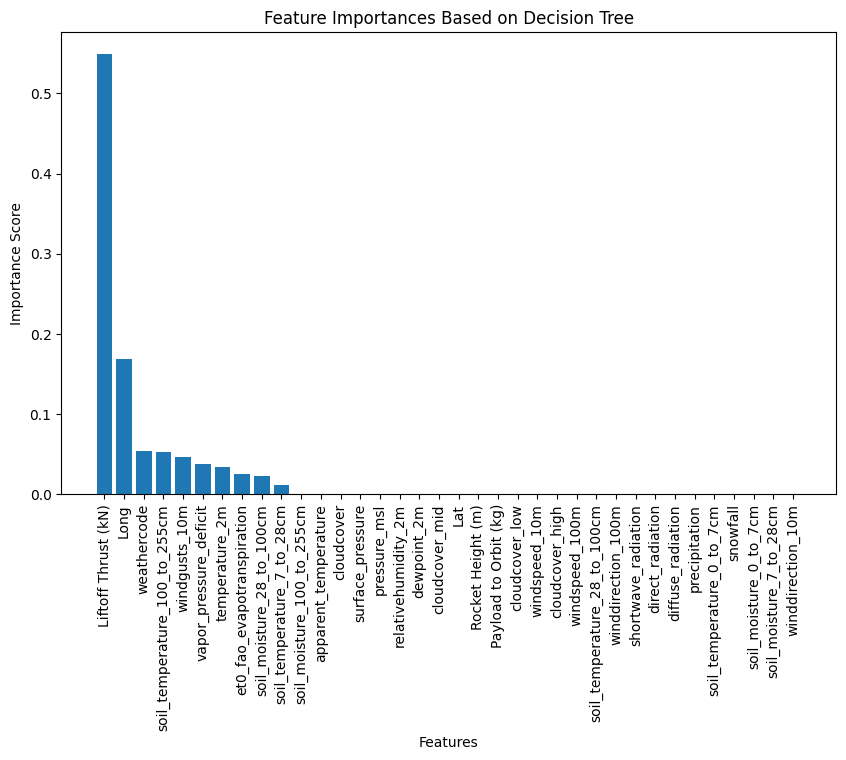

In [21]:
feature_importances = dt_classifier.feature_importances_
# Sort feature importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_features = [X.columns[i] for i in sorted_indices]
# Print feature importance
print("Feature Importance:")
for i, idx in enumerate(sorted_indices):
    print(f"{i+1}. {X.columns[idx]}: {feature_importances[idx]}")
# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
plt.xticks(range(len(sorted_feature_importances)), sorted_features, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importances Based on Decision Tree')
plt.show()


### Random Forest Classifier 

In [22]:
rf_classifier = RandomForestClassifier(n_estimators=200, random_state=42)
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200, random_state=42)

In [23]:
train_preds = rf_classifier.predict(X_train)
y_pred = rf_classifier.predict(X_test)
# Evaluate the model
train_accuracy = accuracy_score(y_train, train_preds)
test_accuracy = accuracy_score(y_test, y_pred)
print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)


Training Accuracy: 0.9927536231884058
Testing Accuracy: 0.875


Feature Importance:
1. Liftoff Thrust (kN): 0.1603601113053288
2. Long: 0.0866777695440169
3. Rocket Height (m): 0.07672451134868724
4. Lat: 0.06002845537183543
5. pressure_msl: 0.052920557588111185
6. soil_temperature_100_to_255cm: 0.04709523766990714
7. soil_moisture_28_to_100cm: 0.040950233358228824
8. soil_moisture_0_to_7cm: 0.038276353782958204
9. Payload to Orbit (kg): 0.03316113491376395
10. soil_moisture_100_to_255cm: 0.029059766762836017
11. surface_pressure: 0.028842719037406064
12. windspeed_10m: 0.023498781439407375
13. soil_moisture_7_to_28cm: 0.021913592642045843
14. apparent_temperature: 0.020179647672312083
15. windgusts_10m: 0.019954335952232245
16. cloudcover: 0.019593370721133253
17. temperature_2m: 0.019434897455519018
18. winddirection_100m: 0.01906261223877736
19. soil_temperature_28_to_100cm: 0.018497248480192487
20. soil_temperature_7_to_28cm: 0.018312915362619763
21. dewpoint_2m: 0.017484431629784896
22. cloudcover_low: 0.017301132447903336
23. cloudcover_mid: 

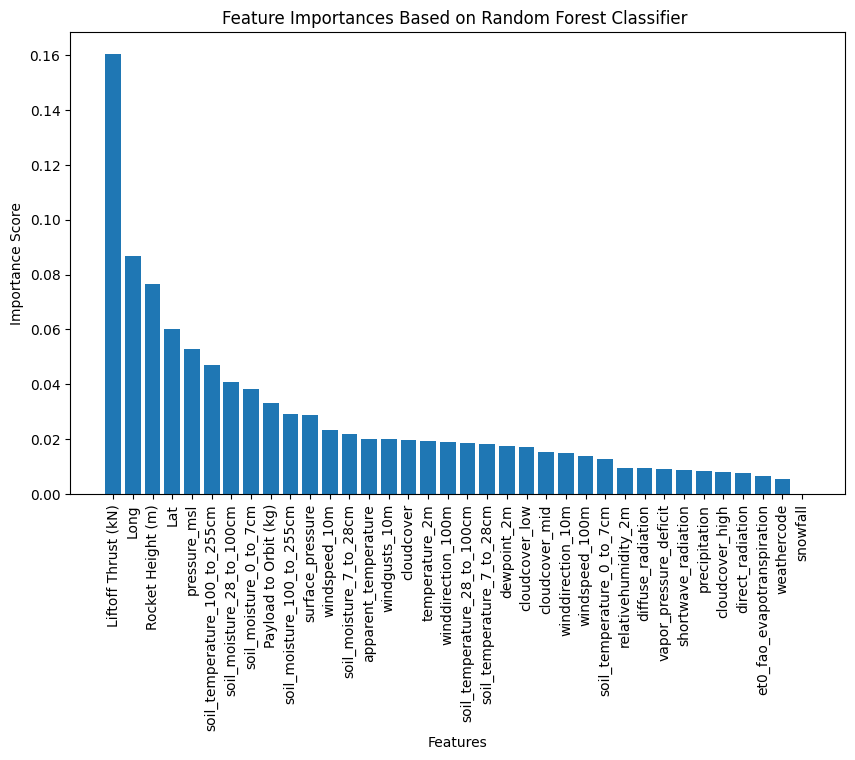

In [24]:
feature_importances = rf_classifier.feature_importances_
# Sort feature importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_features = [X.columns[i] for i in sorted_indices]
# Print feature importance
print("Feature Importance:")
for i, idx in enumerate(sorted_indices):
    print(f"{i+1}. {X.columns[idx]}: {feature_importances[idx]}")
# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
plt.xticks(range(len(sorted_feature_importances)), sorted_features, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importances Based on Random Forest Classifier ')
plt.show()

### Gradient Boosting Classifier

In [25]:
# Create Gradient Boosting Classifier
gb_classifier = GradientBoostingClassifier(n_estimators=200, random_state=42)
# Train the model
gb_classifier.fit(X_train, y_train)

GradientBoostingClassifier(n_estimators=200, random_state=42)

In [26]:
train_preds = gb_classifier.predict(X_train)
y_pred = gb_classifier.predict(X_test)
# Evaluate the model
train_accuracy = accuracy_score(y_train, train_preds)
test_accuracy = accuracy_score(y_test, y_pred)
print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)


Training Accuracy: 0.9927536231884058
Testing Accuracy: 0.875


Feature Importance:
1. Liftoff Thrust (kN): 0.4518219843151878
2. Long: 0.07220128099608773
3. Lat: 0.06858776043422474
4. soil_temperature_100_to_255cm: 0.05057780037966041
5. Rocket Height (m): 0.04931893829012853
6. soil_moisture_0_to_7cm: 0.048073357391080276
7. dewpoint_2m: 0.03729952820961066
8. precipitation: 0.03102136772013412
9. cloudcover_mid: 0.027495548740603122
10. cloudcover: 0.026924867621820867
11. apparent_temperature: 0.022281887523449555
12. windgusts_10m: 0.021706085089042846
13. soil_temperature_7_to_28cm: 0.017833586120074837
14. soil_moisture_100_to_255cm: 0.013327401126638556
15. windspeed_10m: 0.012009763333919515
16. temperature_2m: 0.007682113043396363
17. soil_moisture_7_to_28cm: 0.006366925481453962
18. soil_temperature_28_to_100cm: 0.006186657189027142
19. windspeed_100m: 0.005663788437374698
20. pressure_msl: 0.004403303011489969
21. shortwave_radiation: 0.003153705292143806
22. soil_temperature_0_to_7cm: 0.0030859719121680705
23. surface_pressure: 0.002

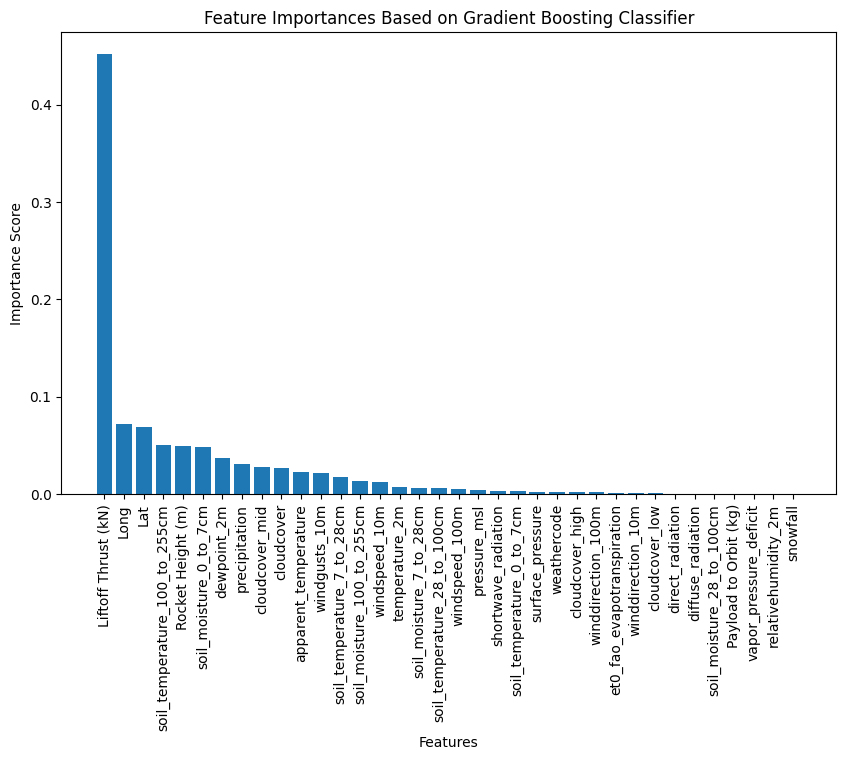

In [27]:
feature_importances = gb_classifier.feature_importances_
# Sort feature importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_features = [X.columns[i] for i in sorted_indices]
# Print feature importance
print("Feature Importance:")
for i, idx in enumerate(sorted_indices):
    print(f"{i+1}. {X.columns[idx]}: {feature_importances[idx]}")
# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
plt.xticks(range(len(sorted_feature_importances)), sorted_features, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importances Based on Gradient Boosting Classifier')
plt.show()

### SVM

In [28]:
model = SVC(kernel='linear', random_state=42)
model.fit(X_train, y_train)

train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

train_accuracy = accuracy_score(y_train, train_preds)
test_accuracy = accuracy_score(y_test, test_preds)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.8913043478260869
Testing Accuracy: 0.75


# 2.  All Space Missions from 1957 SC

In [29]:
space_mission = pd.read_csv('Space_Corrected.csv', encoding='latin-1')
space_mission.head()

,id,Company Name,Location,Datum,Detail,Status Rocket,Cost,Status Mission
0,1,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50,Success
1,2,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success
2,3,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success
3,4,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65,Success
4,5,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145,Success


In [30]:
space_mission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4324 entries, 0 to 4323
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              4324 non-null   int64 
 1   Company Name    4324 non-null   object
 2   Location        4324 non-null   object
 3   Datum           4324 non-null   object
 4   Detail          4324 non-null   object
 5   Status Rocket   4324 non-null   object
 6   Cost            964 non-null    object
 7   Status Mission  4324 non-null   object
dtypes: int64(1), object(7)
memory usage: 270.4+ KB


## 2.1 Number of launches

Countries with more than 15 launches

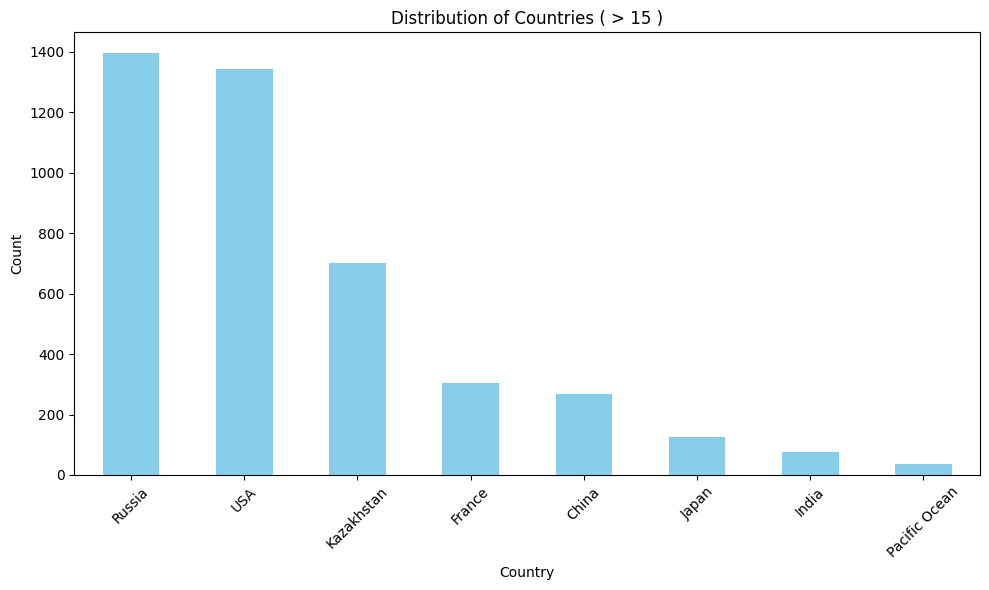

In [31]:
space_mission['Country'] = space_mission['Location'].apply(lambda x: x.split(',')[-1].strip())

country_counts = space_mission['Country'].value_counts()

threshold = 15
country_counts = country_counts[country_counts > threshold]

plt.figure(figsize=(10, 6))
country_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Country')
plt.ylabel('Count')
plt.title('Distribution of Countries ( > 15 )')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Countries with more than 15 launches as the year

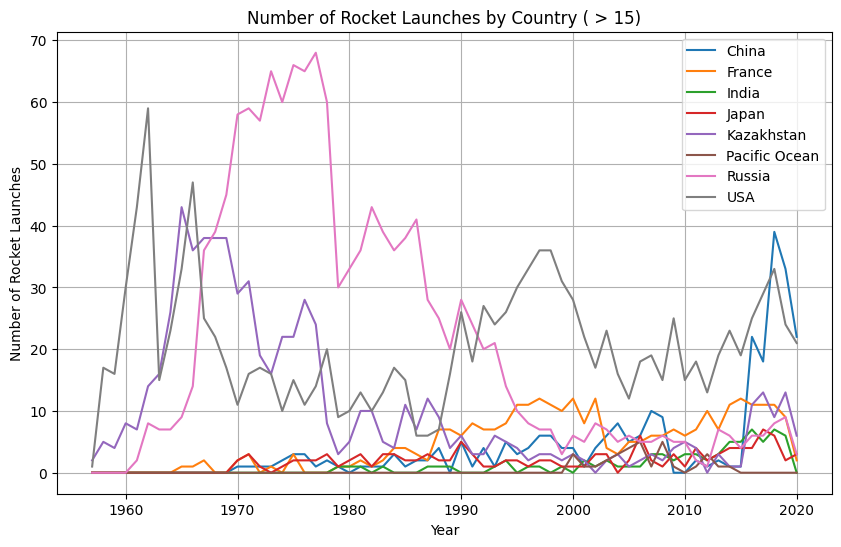

In [32]:
space_mission["Datum"] = pd.to_datetime(space_mission["Datum"],errors="coerce", utc=True)
space_mission["year"] = space_mission["Datum"].dt.year

country_counts = country_counts[country_counts > threshold]

space_mission['Country'] = space_mission['Location'].apply(lambda x: x.split(',')[-1].strip())

filtered_space_mission = space_mission[space_mission['Country'].isin(country_counts.index)]

country_year_counts = filtered_space_mission.groupby(['Country', 'year']).size().unstack().fillna(0)

plt.figure(figsize=(10, 6))

for country in country_year_counts.index:
    plt.plot(country_year_counts.loc[country], label=country)

plt.title('Number of Rocket Launches by Country ( > 15)')
plt.xlabel('Year')
plt.ylabel('Number of Rocket Launches')
plt.legend()
plt.grid(True)
plt.show()

Total launches as the year

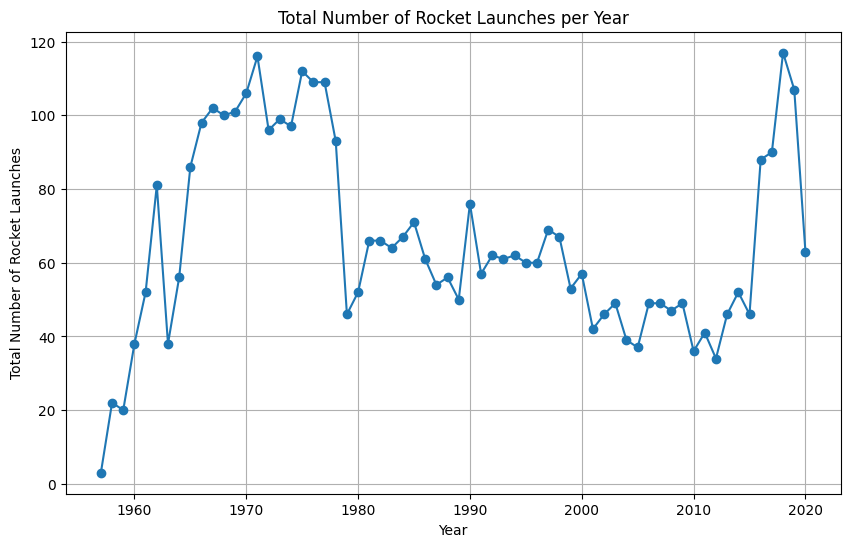

In [33]:
launch_counts = space_mission.groupby('year').size()

plt.figure(figsize=(10, 6))
plt.plot(launch_counts.index, launch_counts.values, marker='o', linestyle='-')
plt.title('Total Number of Rocket Launches per Year')
plt.xlabel('Year')
plt.ylabel('Total Number of Rocket Launches')
plt.grid(True)
plt.show()

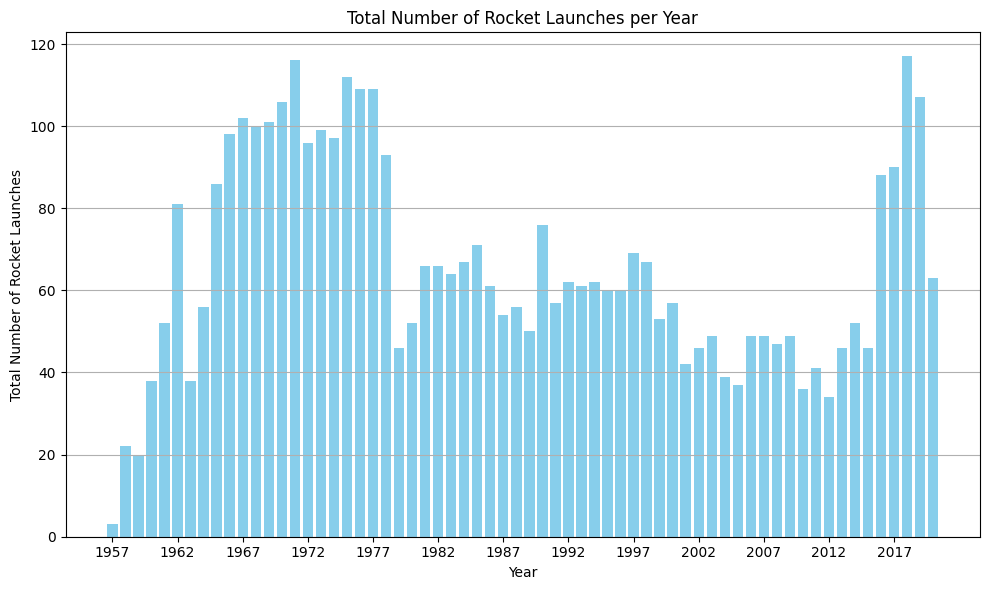

In [34]:
launch_counts = space_mission.groupby('year').size()

plt.figure(figsize=(10, 6))
plt.bar(launch_counts.index, launch_counts.values, color='skyblue')
plt.title('Total Number of Rocket Launches per Year')
plt.xlabel('Year')
plt.ylabel('Total Number of Rocket Launches')
plt.xticks(launch_counts.index[::5])
plt.grid(axis='y')
plt.tight_layout()
plt.show()

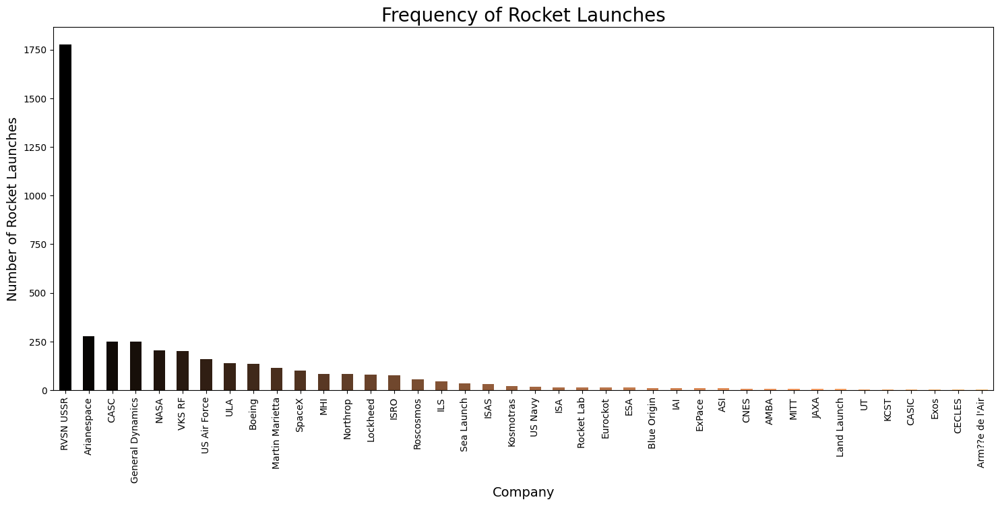

In [35]:
plt.rcParams['figure.figsize'] = (18, 7)

# Calculate the color gradient
color = plt.cm.copper(np.linspace(0, 1, 40))

# Count the frequency of rocket launches by each company
company_counts = space_mission['Company Name'].value_counts()

# Plotting
company_counts.head(40).plot.bar(color=color)
plt.title('Frequency of Rocket Launches', fontsize=20)
plt.xlabel('Company', fontsize=14)
plt.ylabel('Number of Rocket Launches', fontsize=14)
plt.xticks(rotation=90)
plt.grid(False)
plt.show()

## 2.2 Cost

Cost as the year

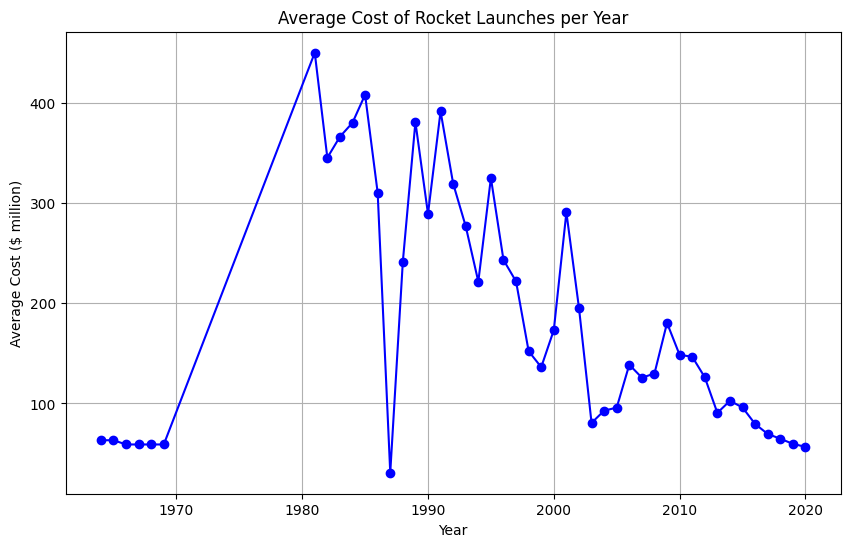

In [36]:
space_mission['Cost'] = pd.to_numeric(space_mission['Cost'], errors='coerce')

space_mission_cleaned = space_mission.dropna(subset=['Cost'])

space_mission_cleaned['Datum'] = pd.to_datetime(space_mission_cleaned['Datum'])

space_mission_cleaned['Year'] = space_mission_cleaned['Datum'].dt.year

average_cost_per_year = space_mission_cleaned.groupby('Year')['Cost'].mean()

plt.figure(figsize=(10, 6))
average_cost_per_year.plot(kind='line', marker='o', color='b', linestyle='-')
plt.title('Average Cost of Rocket Launches per Year')
plt.xlabel('Year')
plt.ylabel('Average Cost ($ million)')
plt.grid(True)
plt.show()

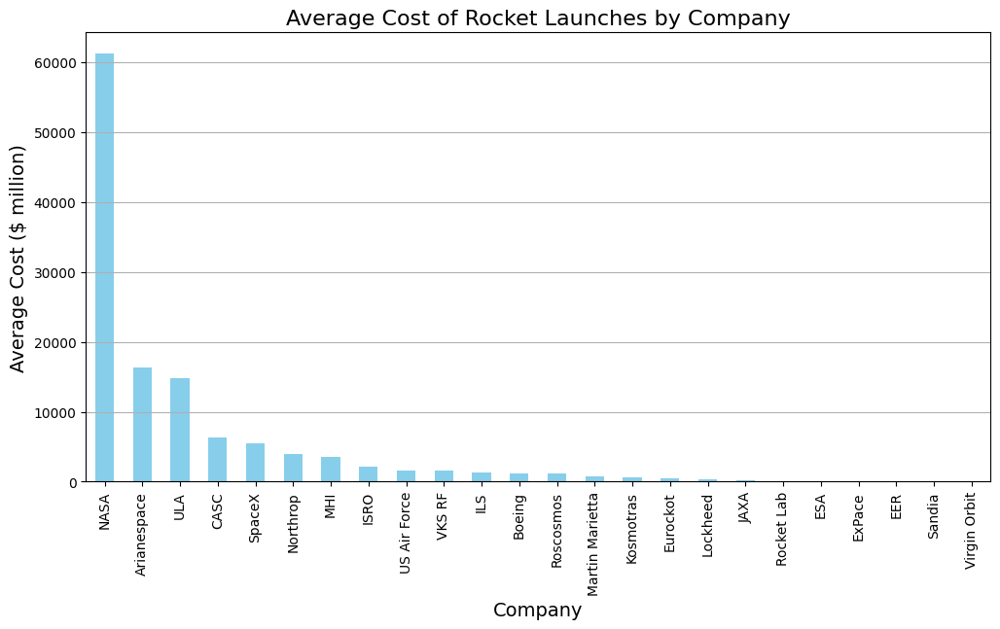

In [37]:
space_mission['Cost'] = pd.to_numeric(space_mission['Cost'], errors='coerce')

space_mission_cleaned = space_mission.dropna(subset=['Cost'])

average_cost_by_company = space_mission_cleaned.groupby('Company Name')['Cost'].sum()

plt.figure(figsize=(12, 6))
average_cost_by_company.sort_values(ascending=False).plot(kind='bar', color='skyblue')
plt.title('Average Cost of Rocket Launches by Company', fontsize=16)
plt.xlabel('Company', fontsize=14)
plt.ylabel('Average Cost ($ million)', fontsize=14)
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.show()

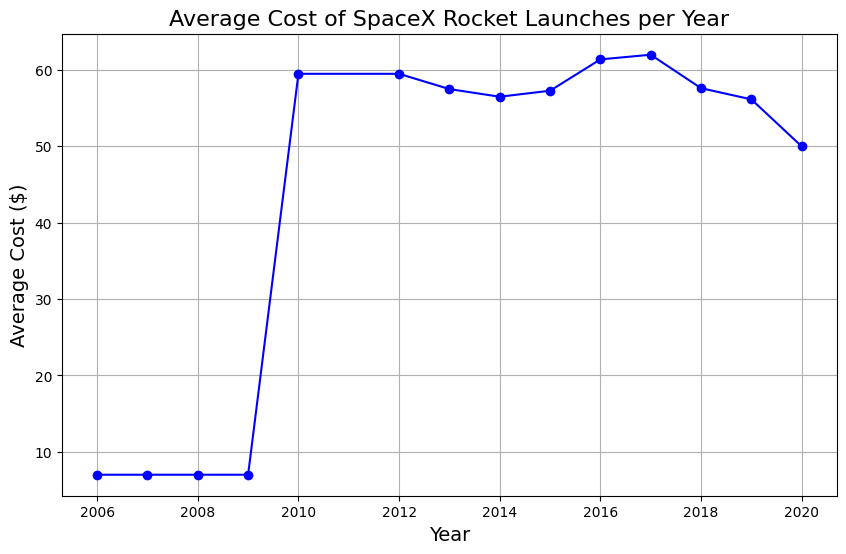

In [38]:
space_mission['Cost'] = pd.to_numeric(space_mission['Cost'], errors='coerce')

spacex_launches = space_mission[space_mission['Company Name'] == 'SpaceX']

spacex_launches_cleaned = spacex_launches.dropna(subset=['Cost'])

spacex_launches_cleaned['Datum'] = pd.to_datetime(spacex_launches_cleaned['Datum'])

spacex_launches_cleaned['Year'] = spacex_launches_cleaned['Datum'].dt.year

average_cost_per_year = spacex_launches_cleaned.groupby('Year')['Cost'].mean()

plt.figure(figsize=(10, 6))
average_cost_per_year.plot(kind='line', marker='o', color='b', linestyle='-')
plt.title('Average Cost of SpaceX Rocket Launches per Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Cost ($)', fontsize=14)
plt.grid(True)
plt.show()

## 2.3 Success and failure

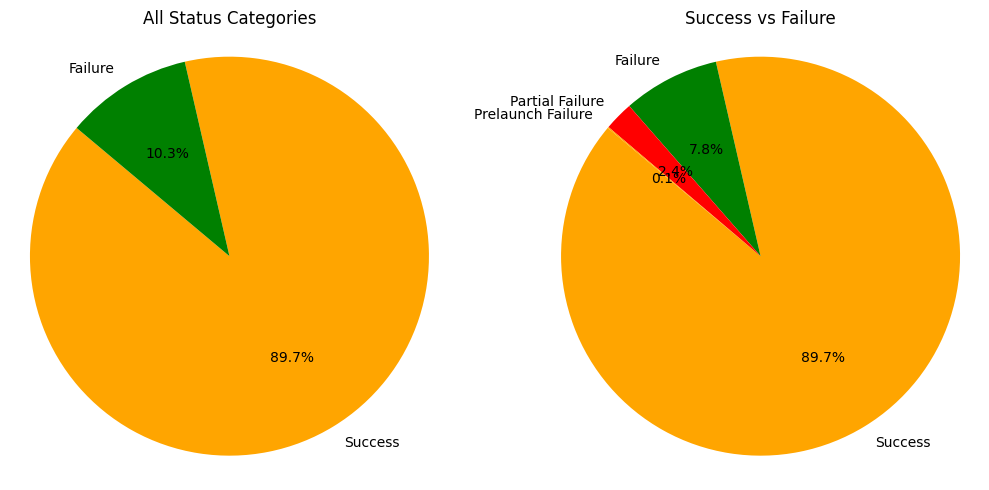

In [39]:
space_mission_cleaned = space_mission.dropna(subset=['Status Mission'])

success_failure = space_mission_cleaned[space_mission_cleaned['Status Mission'].str.contains('Success|Failure')]

space_mission_cleaned['Status Mission'] = space_mission_cleaned['Status Mission'].apply(lambda x: 'Failure' if 'Failure' in x else x)

status_counts_all = space_mission_cleaned['Status Mission'].value_counts()
status_counts_success_failure = success_failure['Status Mission'].value_counts()

colors_for_all_status = ['orange', 'green', 'red']  
colors_for_success_failure = ['green', 'red']  # Success in green, Failure in red

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.pie(status_counts_all, labels=status_counts_all.index, autopct='%1.1f%%', startangle=140, colors=colors_for_all_status)
plt.title('All Status Categories')
plt.axis('equal')

plt.subplot(1, 2, 2)
plt.pie(status_counts_success_failure, labels=status_counts_success_failure.index, autopct='%1.1f%%', startangle=140, colors=colors_for_all_status)
plt.title('Success vs Failure')
plt.axis('equal')

plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

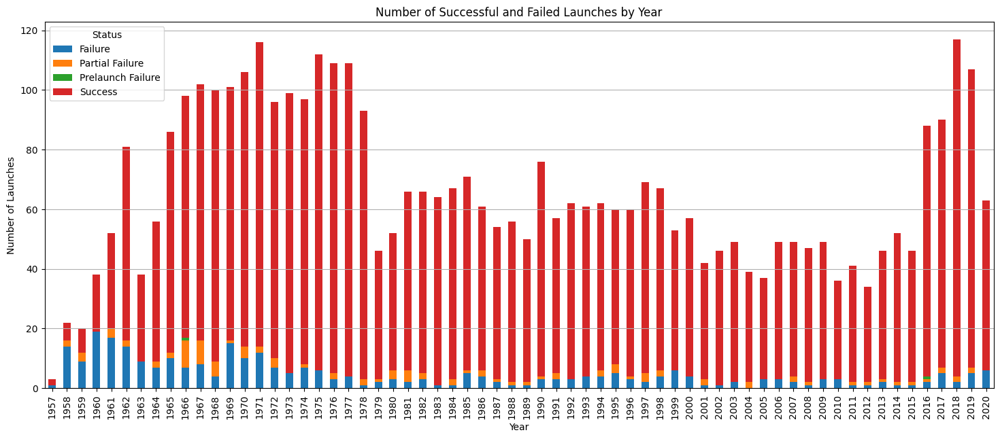

In [40]:
space_mission_cleaned = space_mission.dropna(subset=['Status Mission', 'Datum'])

success_failure = space_mission_cleaned[space_mission_cleaned['Status Mission'].str.contains('Success|Failure')]

success_failure['Datum'] = pd.to_datetime(success_failure['Datum'])

success_failure['Year'] = success_failure['Datum'].dt.year

status_counts_by_year = success_failure.groupby(['Year', 'Status Mission']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
status_counts_by_year.plot(kind='bar', stacked=True)
plt.title('Number of Successful and Failed Launches by Year')
plt.xlabel('Year')
plt.ylabel('Number of Launches')
plt.legend(title='Status')
plt.grid(axis='y')
plt.show()

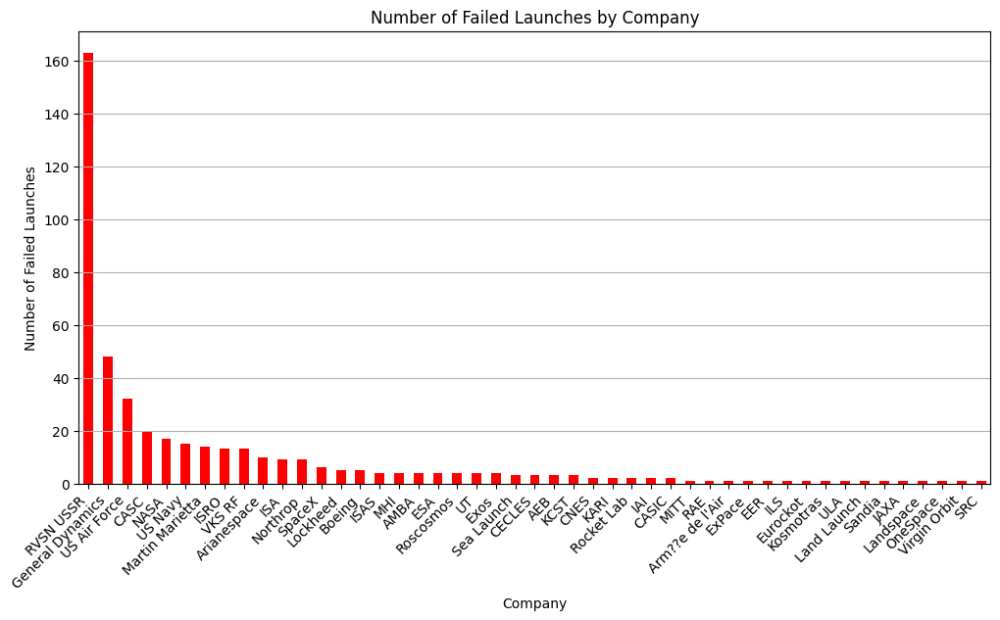

In [41]:
space_mission_cleaned = space_mission.dropna(subset=['Status Mission', 'Company Name'])

failed_missions = space_mission_cleaned[space_mission_cleaned['Status Mission'].str.contains('Failure|Prelaunch Failure|Partial Failure')]

failed_counts_by_company = failed_missions['Company Name'].value_counts()

# Plotting
plt.figure(figsize=(12, 6))
failed_counts_by_company.plot(kind='bar', color='red')
plt.title('Number of Failed Launches by Company')
plt.xlabel('Company')
plt.ylabel('Number of Failed Launches')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y')
plt.show()

<Figure size 1400x800 with 0 Axes>

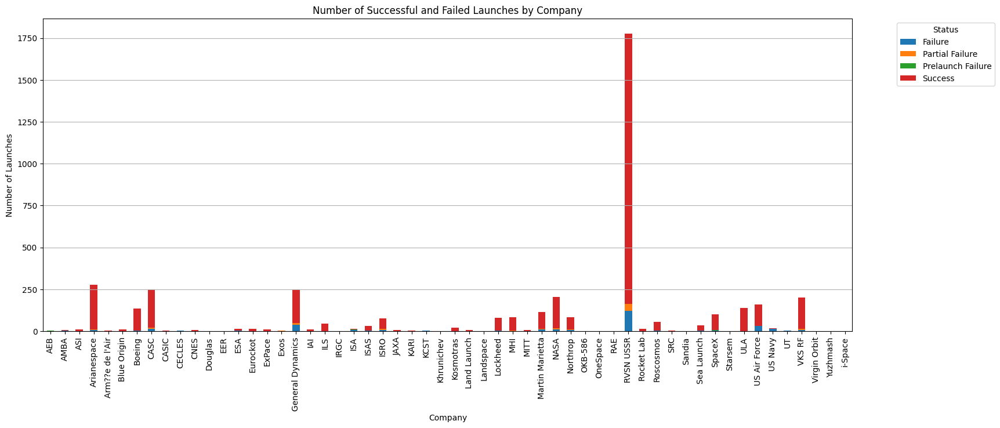

In [42]:
space_mission_cleaned = space_mission.dropna(subset=['Status Mission', 'Company Name'])

success_failure = space_mission_cleaned[space_mission_cleaned['Status Mission'].str.contains('Success|Failure')]

status_counts_by_year_company = success_failure.groupby(['Company Name', 'Status Mission']).size().unstack(fill_value=0)

plt.figure(figsize=(14, 8))
status_counts_by_year_company.plot(kind='bar', stacked=True)
plt.title('Number of Successful and Failed Launches by Company')
plt.xlabel('Company')
plt.ylabel('Number of Launches')
plt.legend(title='Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.show()

## 2.4 Failure findings

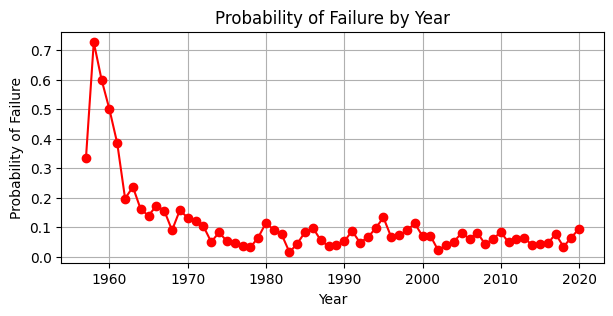

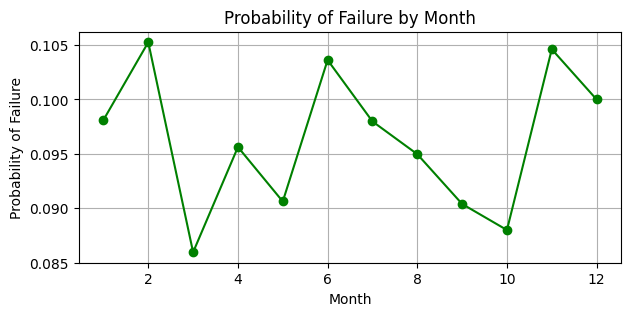

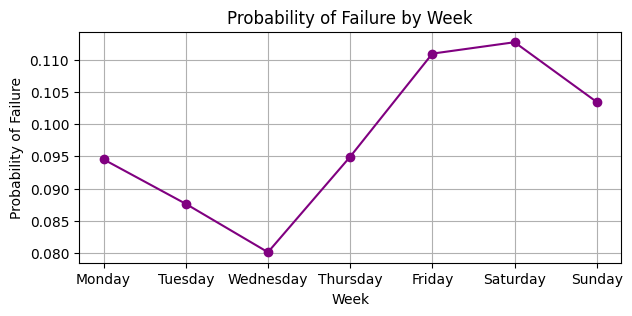

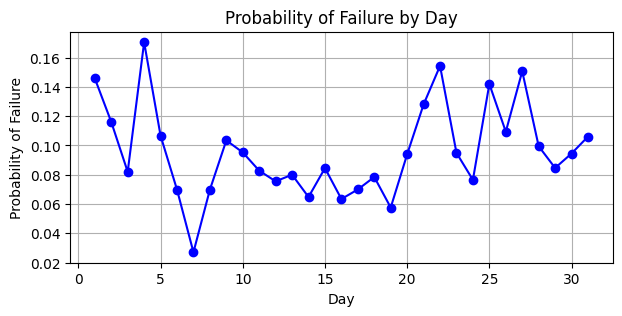

In [43]:
space_mission_cleaned['Datum'] = pd.to_datetime(space_mission_cleaned['Datum'])
failed_missions = space_mission_cleaned[space_mission_cleaned['Status Mission'].str.contains('Failure|Prelaunch Failure|Partial Failure')]

total_launches_by_year = space_mission_cleaned['Datum'].dt.year.value_counts().sort_index()
total_launches_by_month = space_mission_cleaned['Datum'].dt.month.value_counts().sort_index()
total_launches_by_day_of_week = space_mission_cleaned['Datum'].dt.dayofweek.value_counts().sort_index()
total_launches_by_day = space_mission_cleaned['Datum'].dt.day.value_counts().sort_index()

prob_failure_by_year = failed_missions['Datum'].dt.year.value_counts().sort_index() / total_launches_by_year
prob_failure_by_month = failed_missions['Datum'].dt.month.value_counts().sort_index() / total_launches_by_month
prob_failure_by_day_of_week = failed_missions['Datum'].dt.dayofweek.value_counts().sort_index() / total_launches_by_day_of_week
prob_failure_by_day = failed_missions['Datum'].dt.day.value_counts().sort_index() / total_launches_by_day

plt.figure(figsize=(7, 3))
plt.plot(prob_failure_by_year.index, prob_failure_by_year.values, color='red', marker='o', linestyle='-')
plt.title('Probability of Failure by Year')
plt.xlabel('Year')
plt.ylabel('Probability of Failure')
plt.grid(True)
plt.show()

plt.figure(figsize=(7, 3))
plt.plot(prob_failure_by_month.index, prob_failure_by_month.values, color='green', marker='o', linestyle='-')
plt.title('Probability of Failure by Month')
plt.xlabel('Month')
plt.ylabel('Probability of Failure')
plt.grid(True)
plt.show()

plt.figure(figsize=(7, 3))
plt.plot(prob_failure_by_day_of_week.index, prob_failure_by_day_of_week.values, color='purple', marker='o', linestyle='-')
plt.title('Probability of Failure by Week')
plt.xlabel('Week')
plt.ylabel('Probability of Failure')
plt.xticks(range(7), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.grid(True)
plt.show()

plt.figure(figsize=(7, 3))
plt.plot(prob_failure_by_day.index, prob_failure_by_day.values, color='blue', marker='o', linestyle='-')
plt.title('Probability of Failure by Day')
plt.xlabel('Day')
plt.ylabel('Probability of Failure')
plt.grid(True)
plt.show()

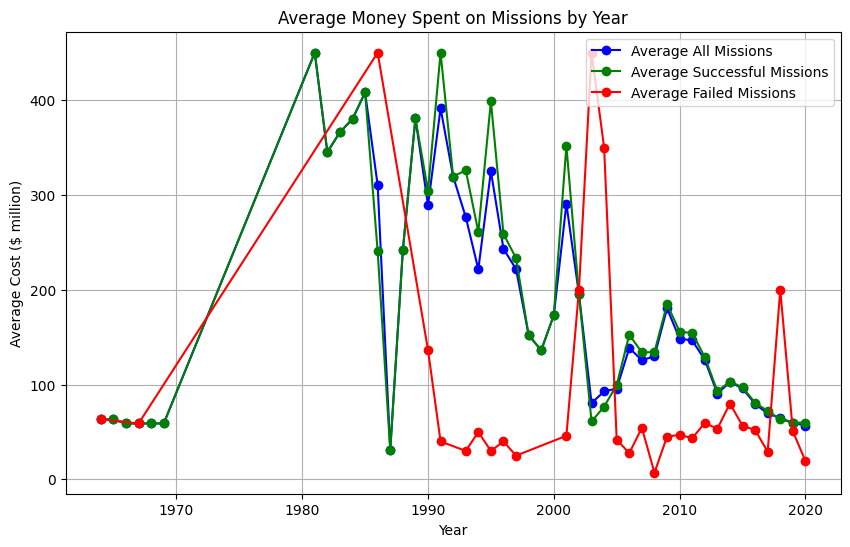

In [44]:
space_mission_cleaned = space_mission.dropna(subset=['Datum', 'Cost'])
space_mission_cleaned = space_mission_cleaned[space_mission_cleaned['Cost'] > 0]

space_mission_cleaned['Datum'] = pd.to_datetime(space_mission_cleaned['Datum'])

space_mission_cleaned['Year'] = space_mission_cleaned['Datum'].dt.year

average_money_by_year = space_mission_cleaned.groupby('Year')['Cost'].mean()

successful_missions = space_mission_cleaned[space_mission_cleaned['Status Mission'] == 'Success']
average_money_successful_by_year = successful_missions.groupby('Year')['Cost'].mean()

failed_missions = space_mission_cleaned[space_mission_cleaned['Status Mission'] != 'Success']
average_money_failed_by_year = failed_missions.groupby('Year')['Cost'].mean()

plt.figure(figsize=(10, 6))
plt.plot(average_money_by_year.index, average_money_by_year.values, color='blue', marker='o', linestyle='-', label='Average All Missions')
plt.plot(average_money_successful_by_year.index, average_money_successful_by_year.values, color='green', marker='o', linestyle='-', label='Average Successful Missions')
plt.plot(average_money_failed_by_year.index, average_money_failed_by_year.values, color='red', marker='o', linestyle='-', label='Average Failed Missions')
plt.title('Average Money Spent on Missions by Year')
plt.xlabel('Year')
plt.ylabel('Average Cost ($ million)')
plt.legend()
plt.grid(True)
plt.show()

## 2.5 Model and Importance of Features

#### Import the Data

In [45]:
data = pd.read_csv('space.csv', encoding='latin-1')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3226 entries, 0 to 3225
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             3226 non-null   int64  
 1   Company Name                   3226 non-null   object 
 2   Location                       3226 non-null   object 
 3   Datum                          3226 non-null   object 
 4   Rocket Status                  3226 non-null   object 
 5   Cost                           923 non-null    object 
 6   Status Mission                 3226 non-null   object 
 7   Lat                            3226 non-null   float64
 8   Long                           3226 non-null   float64
 9   temperature_2m                 3226 non-null   float64
 10  relativehumidity_2m            3226 non-null   int64  
 11  dewpoint_2m                    3226 non-null   float64
 12  apparent_temperature           3226 non-null   f

Correlation Matrix Map

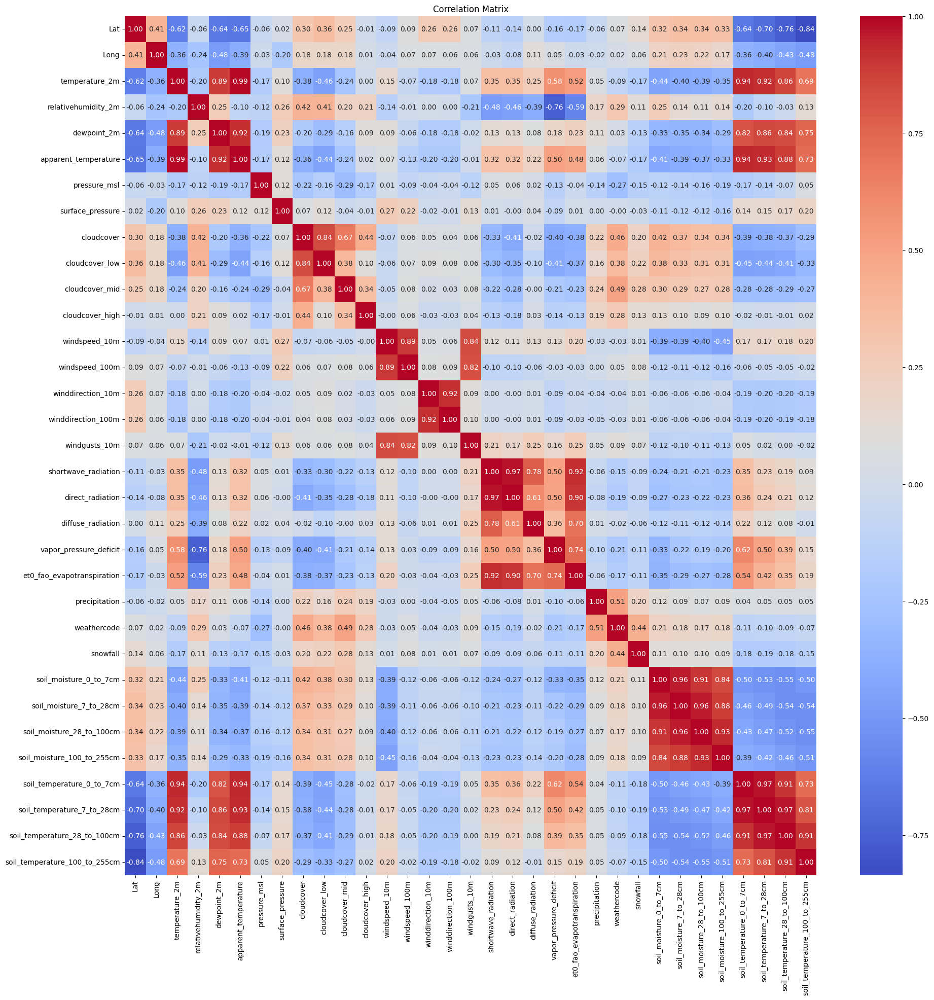

In [46]:
numerical_data = data.select_dtypes(include=np.number)
numerical_data = numerical_data.drop('id', axis=1)
correlation_matrix = numerical_data.corr()
plt.figure(figsize=(22,22))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [47]:
df = pd.read_csv('space.csv', encoding='latin-1')
df_cleaned = df.dropna(axis=1)
X = df_cleaned.drop('id', axis=1)
X = X.drop('Status Mission', axis=1)
y = df_cleaned['Status Mission']
X = X.select_dtypes(include=np.number)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, random_state=42)

In [48]:
print("number of features:", len(X.columns))

number of features: 33


### Decision Tree

In [49]:
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [50]:
train_preds = dt_classifier.predict(X_train)
y_pred = dt_classifier.predict(X_test)
# Evaluate the model
train_accuracy = accuracy_score(y_train, train_preds)
test_accuracy = accuracy_score(y_test, y_pred)
print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 1.0
Testing Accuracy: 0.8333333333333334


Feature Importance:
1. apparent_temperature: 0.07269290164134096
2. surface_pressure: 0.06412177667142427
3. soil_temperature_28_to_100cm: 0.05369298830384447
4. winddirection_100m: 0.047375653416814247
5. soil_moisture_0_to_7cm: 0.04599139225101643
6. windspeed_100m: 0.04432474175561007
7. soil_moisture_7_to_28cm: 0.043959224507115244
8. pressure_msl: 0.043123373368567516
9. soil_moisture_28_to_100cm: 0.03990156294889857
10. temperature_2m: 0.037219848506820474
11. soil_temperature_100_to_255cm: 0.035117076305172676
12. shortwave_radiation: 0.032130715096615935
13. dewpoint_2m: 0.031591751055626616
14. windgusts_10m: 0.03077574481104657
15. diffuse_radiation: 0.02944513895636921
16. cloudcover: 0.02919914024546687
17. soil_temperature_7_to_28cm: 0.02888304857144831
18. soil_temperature_0_to_7cm: 0.028205842292797417
19. Lat: 0.028096846944288323
20. cloudcover_mid: 0.02693821539297838
21. soil_moisture_100_to_255cm: 0.02689302531146895
22. windspeed_10m: 0.026531894702155986
23. relat

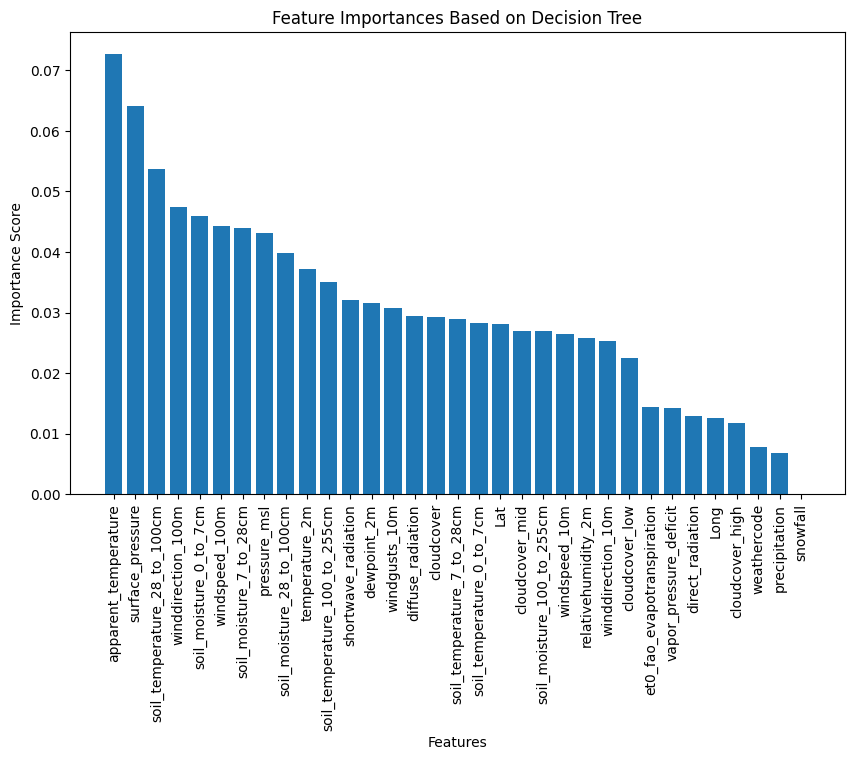

In [51]:
feature_importances = dt_classifier.feature_importances_
# Sort feature importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_features = [X.columns[i] for i in sorted_indices]
# Print feature importance
print("Feature Importance:")
for i, idx in enumerate(sorted_indices):
    print(f"{i+1}. {X.columns[idx]}: {feature_importances[idx]}")
# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
plt.xticks(range(len(sorted_feature_importances)), sorted_features, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importances Based on Decision Tree')
plt.show()

### Random Forest Classifier

In [52]:
rf_classifier = RandomForestClassifier(n_estimators=200, random_state=42)
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200, random_state=42)

In [53]:
train_preds = rf_classifier.predict(X_train)
y_pred = rf_classifier.predict(X_test)
# Evaluate the model
train_accuracy = accuracy_score(y_train, train_preds)
test_accuracy = accuracy_score(y_test, y_pred)
print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 1.0
Testing Accuracy: 0.9259259259259259


Feature Importance:
1. surface_pressure: 0.04394717441683282
2. windspeed_100m: 0.04178598412476098
3. apparent_temperature: 0.04041696928903851
4. pressure_msl: 0.0399777916747683
5. winddirection_100m: 0.03853323687482995
6. temperature_2m: 0.03741240159863261
7. dewpoint_2m: 0.037155722284501334
8. windgusts_10m: 0.037035448615987114
9. windspeed_10m: 0.036030235693112846
10. soil_temperature_100_to_255cm: 0.03557642937818024
11. soil_moisture_28_to_100cm: 0.03554404565019442
12. winddirection_10m: 0.03549165255236881
13. soil_moisture_7_to_28cm: 0.03479445356817092
14. soil_temperature_28_to_100cm: 0.03467175575018819
15. soil_moisture_0_to_7cm: 0.03397462274926792
16. relativehumidity_2m: 0.03362414967063243
17. soil_temperature_7_to_28cm: 0.03327169129413467
18. vapor_pressure_deficit: 0.03267468751233175
19. soil_moisture_100_to_255cm: 0.030998839571048632
20. diffuse_radiation: 0.030271660278652284
21. shortwave_radiation: 0.02925538985681879
22. soil_temperature_0_to_7cm: 0.02

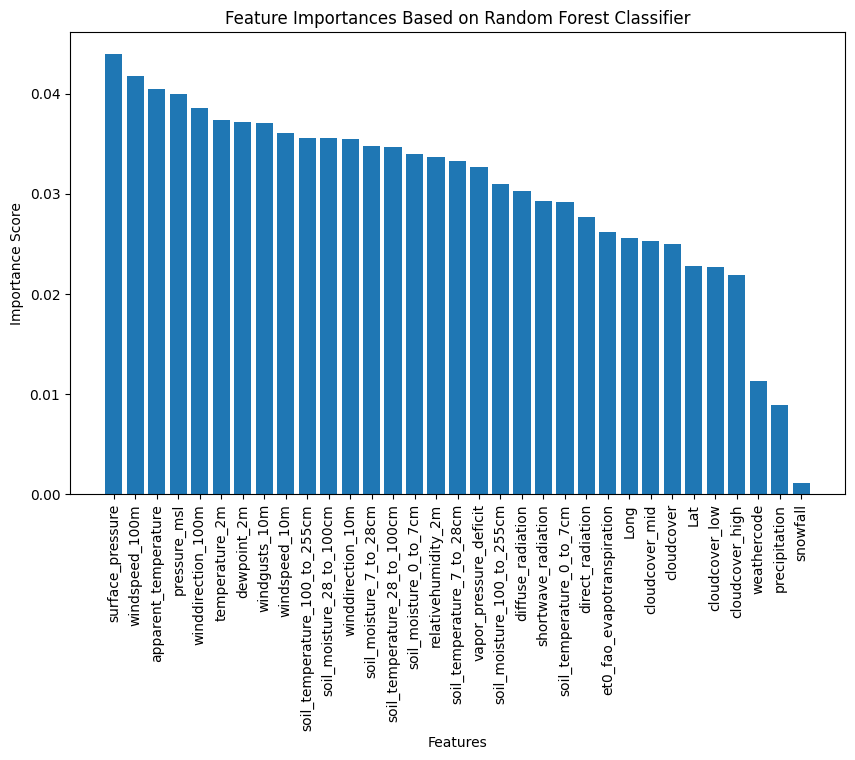

In [54]:
feature_importances = rf_classifier.feature_importances_
# Sort feature importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_features = [X.columns[i] for i in sorted_indices]
# Print feature importance
print("Feature Importance:")
for i, idx in enumerate(sorted_indices):
    print(f"{i+1}. {X.columns[idx]}: {feature_importances[idx]}")
# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
plt.xticks(range(len(sorted_feature_importances)), sorted_features, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importances Based on Random Forest Classifier')
plt.show()

### Gradient Boosting Classifier

In [55]:
gb_classifier = GradientBoostingClassifier(random_state=42)
# Train the model
gb_classifier.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

In [56]:
train_preds = gb_classifier.predict(X_train)
y_pred = gb_classifier.predict(X_test)
# Evaluate the model
train_accuracy = accuracy_score(y_train, train_preds)
test_accuracy = accuracy_score(y_test, y_pred)
print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.9627937336814621
Testing Accuracy: 0.9012345679012346


Feature Importance:
1. surface_pressure: 0.06384299169919314
2. pressure_msl: 0.058265858026809836
3. soil_moisture_28_to_100cm: 0.054374364649269785
4. soil_temperature_100_to_255cm: 0.050615206311245824
5. diffuse_radiation: 0.04844194232764178
6. apparent_temperature: 0.04024671485904394
7. vapor_pressure_deficit: 0.039601874468766944
8. temperature_2m: 0.039521706877558196
9. direct_radiation: 0.03779968568626959
10. soil_moisture_7_to_28cm: 0.03702907109712569
11. winddirection_100m: 0.03560015007530068
12. Long: 0.03455485589917378
13. soil_moisture_0_to_7cm: 0.034160169937544164
14. windspeed_10m: 0.033048924673308756
15. windspeed_100m: 0.03122963625059368
16. relativehumidity_2m: 0.03090968237132946
17. Lat: 0.02963974034078852
18. et0_fao_evapotranspiration: 0.02786275454055596
19. cloudcover: 0.027218780897534864
20. soil_temperature_0_to_7cm: 0.02717228239940016
21. cloudcover_mid: 0.02513003987972562
22. soil_moisture_100_to_255cm: 0.02512294588491657
23. dewpoint_2m: 0.02

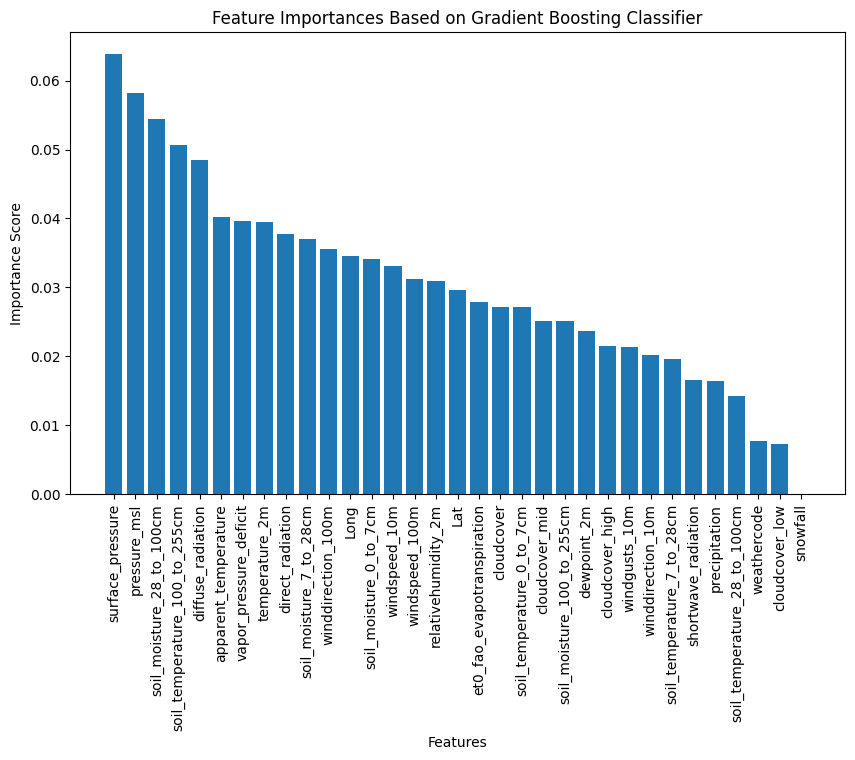

In [57]:
feature_importances = gb_classifier.feature_importances_
# Sort feature importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_features = [X.columns[i] for i in sorted_indices]
# Print feature importance
print("Feature Importance:")
for i, idx in enumerate(sorted_indices):
    print(f"{i+1}. {X.columns[idx]}: {feature_importances[idx]}")
# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
plt.xticks(range(len(sorted_feature_importances)), sorted_features, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importances Based on Gradient Boosting Classifier')
plt.show()

### SVM

In [58]:
model = SVC(kernel='linear', random_state=42)
model.fit(X_train, y_train)

train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

train_accuracy = accuracy_score(y_train, train_preds)
test_accuracy = accuracy_score(y_test, test_preds)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.935378590078329
Testing Accuracy: 0.9259259259259259


# 3. Map Visualization

In [59]:
df = pd.read_csv('Space.csv')
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.Long, df.Lat), crs="EPSG:4326"
)

In [60]:
# Path to the world map shp file
dir = 'D:/HW/Data mining/project/Project/world-administrative-boundaries'
world_map_shp = os.listdir(dir)
shp_file = [file for file in world_map_shp if file.endswith('.shp')]
world = gpd.read_file(os.path.join(dir, shp_file[0]))

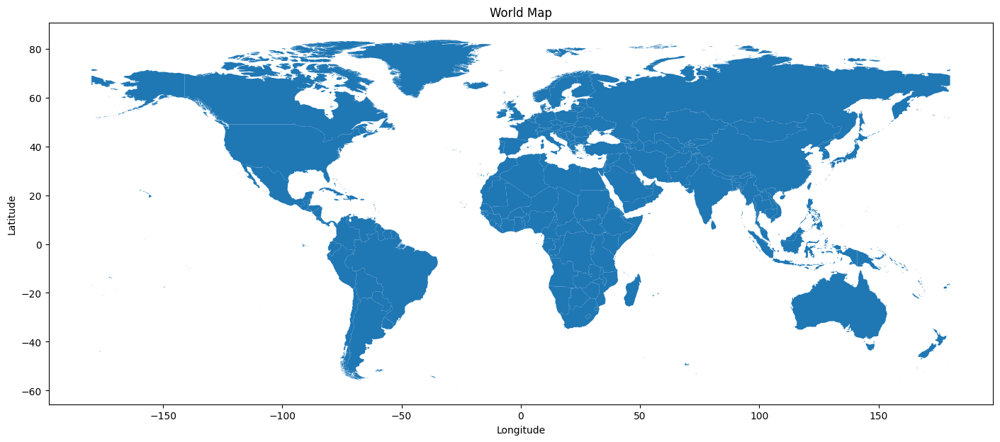

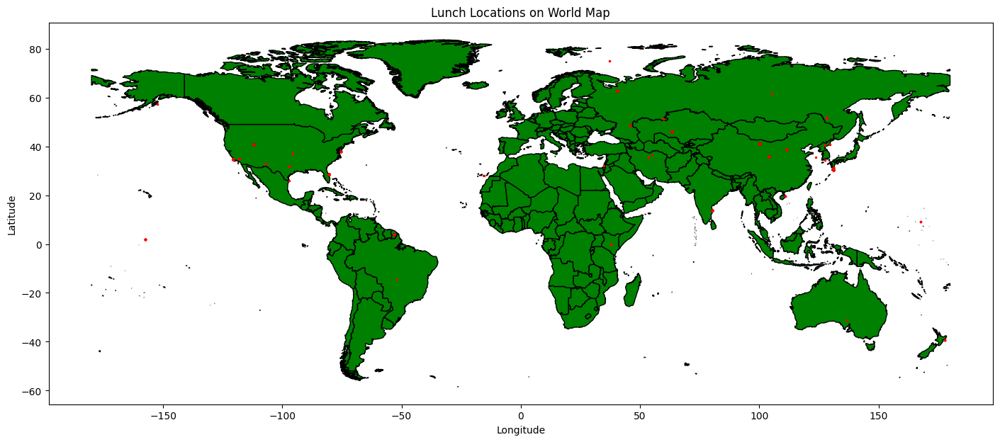

In [61]:
# Plot the map
world.plot()
plt.title('World Map')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Plot the points from the DataFrame  
world.plot(color='green', edgecolor='black')
plt.scatter(df['Long'], df['Lat'], color='red', marker='o', s=2)  # Adjust marker size as needed

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Lunch Locations on World Map')
plt.show()

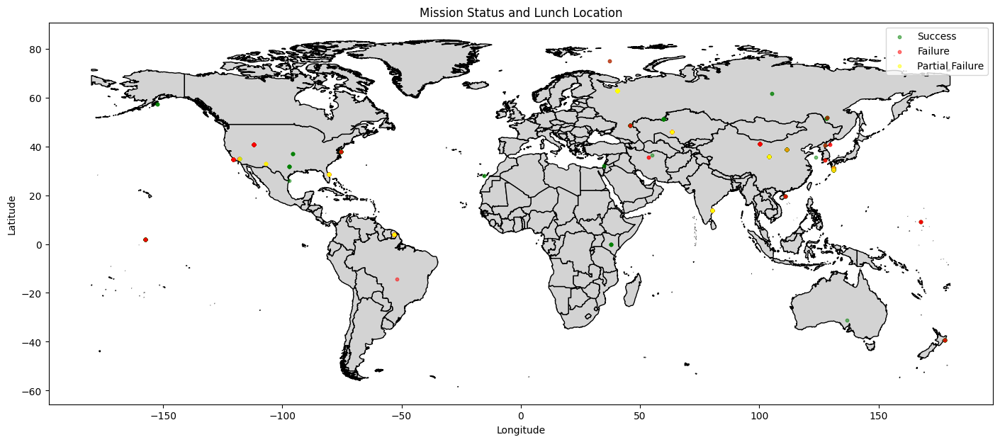

In [62]:
# Plot the map
world.plot(color='lightgrey', edgecolor='black')
plt.title('World Map')

# Plot the points from the DataFrame
# Map mission status to colors
status_colors = {'Success': 'green', 'Failure': 'red', 'Partial Failure': 'yellow'}
for status, color in status_colors.items():
    subset = df[df['Status Mission'] == status]
    plt.scatter(subset['Long'], subset['Lat'], color=color, label=status, marker='o', s=10, alpha=0.5)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Mission Status and Lunch Location')
plt.legend()
plt.savefig('status_loc.png',dpi=1080)
plt.show()

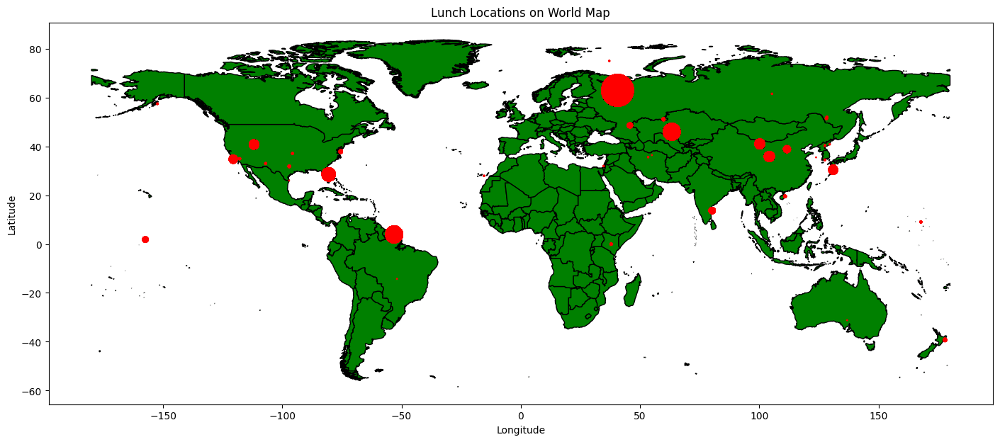

In [63]:
# Calculate density based on occurrence of longitude and latitude
density_df = df.groupby(['Long', 'Lat']).size().reset_index(name='Density')

# Merge density back to original DataFrame
df = pd.merge(df, density_df, on=['Long', 'Lat'])

# Plot the points from the df with marker size proportional to density
world.plot(color='green', edgecolor='black')
plt.scatter(df['Long'], df['Lat'], color='red', marker='o', s=df['Density'])

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Lunch Locations on World Map')
plt.savefig('lunch_loc.png',dpi=1080)
plt.show()

In [64]:
num_distinct_locations = df['Location'].nunique()

# Print the number of distinct locations
print("Number of distinct locations:", num_distinct_locations)

Number of distinct locations: 107


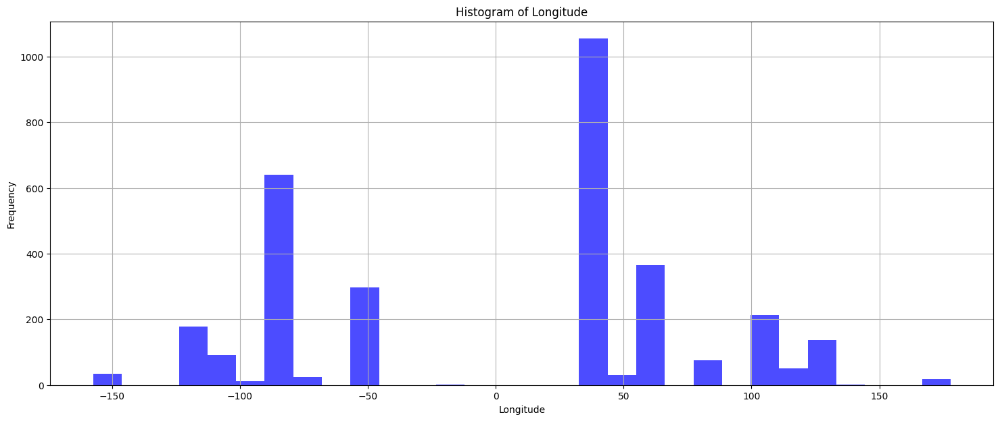

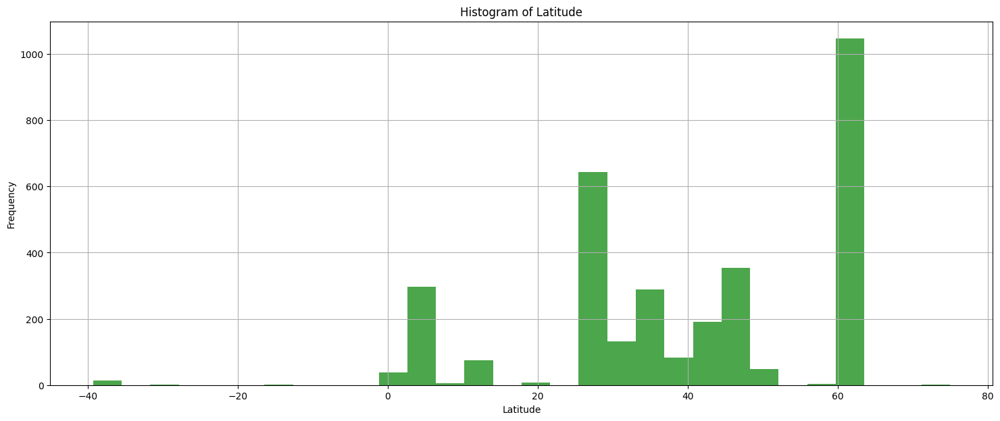

In [65]:
# Plot histogram for longitude
plt.hist(df['Long'], bins=30, color='blue', alpha=0.7)
plt.title('Histogram of Longitude')
plt.xlabel('Longitude')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('long.png',dpi=1080)
plt.show()

# Plot histogram for latitude
# plt.figure()
plt.hist(df['Lat'], bins=30, color='green', alpha=0.7)
plt.title('Histogram of Latitude')
plt.xlabel('Latitude')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('lat.png',dpi=1080)
plt.show()

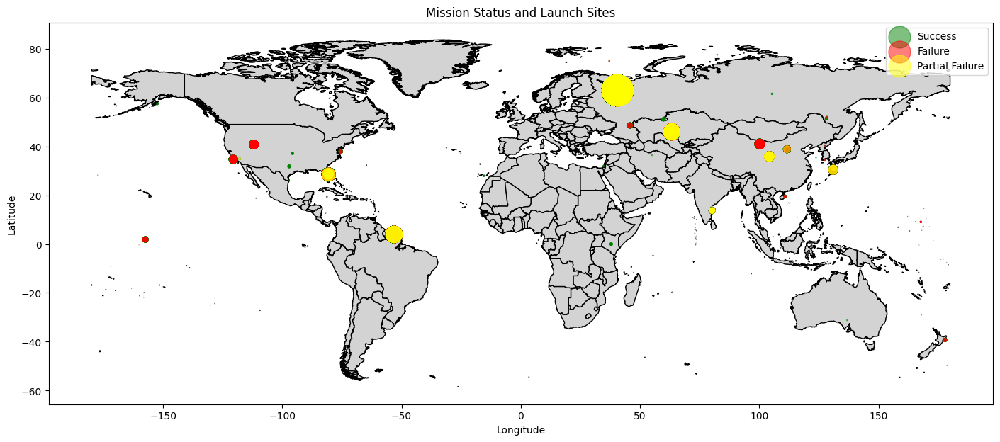

In [66]:
success_counts = df[df['Status Mission'] == 'Success'].groupby(['Long', 'Lat']).size().reset_index(name='Success_Count')

df = pd.merge(df, success_counts, on=['Long', 'Lat'], how='left', suffixes=('', '_success'))

df['Success_Count'] = df['Success_Count'].fillna(0)


world.plot(color='lightgrey', edgecolor='black')
plt.title('World Map')

status_colors = {'Success': 'green', 'Failure': 'red', 'Partial Failure': 'yellow'}
for status, color in status_colors.items():
    subset = df[df['Status Mission'] == status]
    plt.scatter(subset['Long'], subset['Lat'], color=color, label=status, marker='o', alpha=0.5, s=subset['Success_Count'])

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Mission Status and Launch Sites')
plt.legend()
plt.savefig('stat.png',dpi=1080)
plt.show()